### LSE Data Analytics Online Career Accelerator 

# DA301:  Advanced Analytics for Organisational Impact

## Assignment template

### Background and goals

Turtle Games is a game manufacturer and retailer. They manufacture and sell their own products, along with sourcing and selling products manufactured by other companies. Their product range includes books, board games, video games and toys. They have a global customer base and have a business objective of improving overall sales performance by utilising customer trends. In particular, we aim to look at: 

- how customers accumulate loyalty points 
- exploring the structure using decision trees 
- exploring clusters in customer behaviour 
- can social data (e.g. customer reviews) be used in marketing campaigns?

# Linear regression using Python
The marketing department of Turtle Games prefers Python for data analysis. As you are fluent in Python, they asked you to assist with data analysis of social media data. The marketing department wants to better understand how users accumulate loyalty points. Therefore, you need to investigate the possible relationships between the loyalty points, age, remuneration, and spending scores. Note that you will use this data set in future modules as well and it is, therefore, strongly encouraged to first clean the data as per provided guidelines and then save a copy of the clean data for future use.

## 1. Load and explore the data

In [6]:
# Imports
import numpy as np
import numpy.typing as npt # allows numpy type hints
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm 
import statsmodels.stats.api as sms
import sklearn
import math
from sklearn import metrics
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.stattools import durbin_watson
from sklearn.tree import DecisionTreeRegressor, plot_tree 
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor 
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import accuracy_score
from scipy.spatial.distance import cdist
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
import warnings
import nltk 
import os 
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from nltk.corpus import stopwords
from nltk.corpus import words
from nltk.stem.wordnet import WordNetLemmatizer
from textblob import TextBlob
from scipy.stats import norm
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer

#Common font sizes for charts
title_fontsize=18
axis_label_fontsize=16
legend_fontsize=16

#Define functions for later use

#Create a MatplotLib scatterplot with optional regression line for for ndarrays x,y and optionally predicted data ndarray y_pred
# bool plotLine - controls adding line for y_pred 
# str title,x_label,y_label - title and axis labels
#bool add_hline - controls adding a line at position hline_value for example for a zero line when there are negative values
#optional hue variable hue
#df is an optional dataframe only needed when we pass a hue
def scatterplot(x:npt.NDArray,y:npt.NDArray,y_pred:npt.NDArray,plotLine,colour:str,line_colour:str,title:str,x_label:str,y_label:str,
               x_lim:int=0,y_lim:int=0,add_hline=False,hline_value=0,save_filename="",hue="",df=None,seaborn_palette=[],legend_pos=''):
    
    # Create a scatterplot with a regression line.  Use Seaborn for scatter

    #use hue if provided
    if hue=="":
        plt.scatter(x, y, color = colour)  
    else:
        sns.scatterplot(data=df,x=x,y=y,hue=hue,palette=seaborn_palette)

       
    #Plot regression line
    if(plotLine):
        plt.plot(x, y_pred, color = line_colour)

    # Set the title and legends for the graph.  
    plt.title(title, fontsize=title_fontsize)
    plt.xlabel(x_label,fontsize=axis_label_fontsize)
    plt.ylabel(y_label,fontsize=axis_label_fontsize) 
    plt.xticks(fontsize=axis_label_fontsize)
    plt.yticks(fontsize=axis_label_fontsize)

    #Set axis limits
    plt.xlim(x_lim)
    plt.ylim(y_lim)

    #optionally add the h. line
    if add_hline:
        plt.axhline(hline_value,color="black")      

    #Add legend custom position 
    if legend_pos!='':
        plt.legend(loc=legend_pos,prop={'size': legend_fontsize})

    if save_filename!="":
        plt.savefig(save_filename,bbox_inches='tight',dpi=800)
        
    # Show the graph. 
    plt.show() 

#Create a kde plot using Seaborn for a series, passing colour of line, optional shading, title, and x/y axis labels
#Pass the mean to show a vertical mean line
def kdeplot(data,x:str,colour:str="blue",fill:bool=True,title:str="",x_label:str="",y_label:str="",mean:float=0,save_filename=""):
    
    sns.kdeplot(data,x=x, color=colour, fill=fill)

    # Setting the X and Y Label and title
    plt.xlabel(x_label,fontsize=axis_label_fontsize)
    plt.ylabel(y_label,fontsize=axis_label_fontsize)
    plt.title(title,fontsize=title_fontsize)
    plt.xticks(fontsize=axis_label_fontsize)
    plt.yticks(fontsize=axis_label_fontsize)

    if mean!=0:
        plt.axvline(mean,color="black")

    if save_filename!="":
        plt.savefig(save_filename,bbox_inches='tight')
        
    plt.show()

#Histogram for categorical variable x in dataframe data with title and x/y axis labels
#Pass the mean to show a vertical mean line
def histplot(data,x:str,bins:int,title:str,x_label:str,y_label:str,mean:float=0,save_filename=""):
    
    sns.histplot(data=data, x=x, bins=bins)

    plt.xlabel(x_label,fontsize=axis_label_fontsize)
    plt.ylabel(y_label,fontsize=axis_label_fontsize)
    plt.title(title,fontsize=title_fontsize)
    plt.xticks(fontsize=axis_label_fontsize)
    plt.yticks(fontsize=axis_label_fontsize)

    if mean!=0:
        plt.axvline(mean,color="black")

    if save_filename!="":
        plt.savefig(save_filename,bbox_inches='tight')

    plt.show()

def barplot(data,x:str,y:str,title:str,x_label:str,y_label:str,hue:str="",legend=True,save_filename="",vertical_xLabels=False):

    sns.barplot(data, x=x, y=y, hue=hue, legend=legend)

    plt.xlabel(x_label,fontsize=axis_label_fontsize)
    plt.ylabel(y_label,fontsize=axis_label_fontsize)
    plt.title(title,fontsize=title_fontsize)
    plt.xticks(fontsize=axis_label_fontsize)
    plt.yticks(fontsize=axis_label_fontsize)

    if vertical_xLabels:
        plt.xticks(rotation=90)

    if save_filename!="":
        plt.savefig(save_filename,bbox_inches='tight')
    
    plt.show()

#Bar chart with counts of obervations in categorical variable x, with optional hue to break down data by subcategory
#Optionally add counts above the bars
#Order by series.value counts

def countplot(series,x:str,title:str,x_label:str,y_label:str,addBarCounts:bool=True,save_filename=""):

    ax=sns.countplot(data=series,x=series[x],hue=x,order=series[x].value_counts(ascending=True).index)

    for container in ax.containers:
        ax.bar_label(container,fontsize=14)

    plt.xlabel(x_label,fontsize=axis_label_fontsize)
    plt.ylabel(y_label,fontsize=axis_label_fontsize)
    plt.title(title,fontsize=title_fontsize)
    plt.xticks(fontsize=axis_label_fontsize)
    plt.yticks(fontsize=axis_label_fontsize)

    if save_filename!="":
        plt.savefig(save_filename,bbox_inches='tight')
        
    plt.show()  


def boxplot(data,title,x_label,y_label,whisker:float=1.5,orient="h",save_filename=""):
    
    sns.boxplot(data,whis=whisker,orient=orient)

    plt.xlabel(x_label,fontsize=axis_label_fontsize)
    plt.ylabel(y_label,fontsize=axis_label_fontsize)
    plt.title(title,fontsize=title_fontsize)
    plt.xticks(fontsize=axis_label_fontsize)
    plt.yticks(fontsize=axis_label_fontsize)
    
    if save_filename!="":
        plt.savefig(save_filename,bbox_inches='tight')
        
    plt.show()


#Print min/max/mean/median/std dev/1st and 3rd quartile,IQR for a pandas series
def printBasicStats(series,friendlyName):

    print(f"Basic stats for {friendlyName}")
    print(f"Minimum {series.min()}")
    print(f"Maximum {series.max()}")
    print(f"Mean {round(series.mean(),2)}")
    print(f"Median {series.quantile(0.5)}")

    q1=round(series.quantile(0.25),2)
    q3=round(series.quantile(0.75),2)
    IQR=q3-q1

    print(f"1st Quartile: {q1}")
    print(f"3rd Quartile: {q3}")
    print(f"IQR: {IQR}")

    print(f"Population standard deviation: {round(series.std(ddof=0),2)}")

#Show Q-Q- plot for data passing line, fit, axis labels and title
def qqplot(data,line:str="45",fit:bool=True,x_label:str="",y_label:str="",title:str="",save_filename=""):
    sm.qqplot(data,line=line,fit=fit)

    plt.xlabel(x_label,fontsize=axis_label_fontsize)
    plt.ylabel(y_label,fontsize=axis_label_fontsize)
    plt.title(title,fontsize=title_fontsize)
    plt.xticks(fontsize=axis_label_fontsize)
    plt.yticks(fontsize=axis_label_fontsize)

    if save_filename!="":
        plt.savefig(save_filename,bbox_inches='tight')
    
    plt.show()

#Produce pairplot for dataframe data with title=title
def pairplot(data,title,save_filename=""):
    sns.pairplot(data)
    plt.title(title,fontsize=title_fontsize)

    if save_filename!="":
        plt.savefig(save_filename,bbox_inches='tight')
        
    plt.show()

#Simple line plot using x and y with optional marker
def lineplot(x,y,marker="o",title="",x_label="",y_label="",save_filename=""):
    
    plt.plot(x,y,marker='o')

    plt.xlabel(x_label,fontsize=axis_label_fontsize)
    plt.ylabel(y_label,fontsize=axis_label_fontsize)
    plt.title(title,fontsize=title_fontsize)
    plt.xticks(fontsize=axis_label_fontsize)
    plt.yticks(fontsize=axis_label_fontsize)

    if save_filename!="":
        plt.savefig(save_filename,bbox_inches='tight')

    plt.show()
    
#Print errors for predicted and observed values (must be same length)
def printErrors(observed,predicted):

    mae=metrics.mean_absolute_error(observed, predicted)
    msqe=metrics.mean_squared_error(observed, predicted)
    
    print('Mean Absolute Error:', mae)
    print('Mean Square Error :', msqe)
    
    rms_error_difference=math.sqrt(msqe)-mae
    print("RMS error minus MAE:",rms_error_difference)

In [7]:
# Load the CSV file(s) as customers.
reviews=pd.read_csv("turtle_reviews.csv")
reviews.head()

# View the DataFrame.
reviews.head(10)

,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,language,platform,product,review,summary
0,Male,18,12.30,39,210,graduate,EN,Web,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,EN,Web,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,EN,Web,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,EN,Web,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,EN,Web,291,As my review of GF9's previous screens these w...,Money trap
5,Female,24,13.94,76,573,PhD,EN,Web,977,Grandson loves,Five Stars
6,Female,37,14.76,6,61,diploma,EN,Web,979,"I have bought many gm screens over the years, ...",Best gm screen ever
7,Female,25,14.76,94,772,graduate,EN,Web,1012,Came in perfect condition.,Five Stars
8,Male,66,15.58,3,31,PhD,EN,Web,1031,Could be better but its still great. I love th...,Great but could be even better
9,Female,32,15.58,72,724,PhD,EN,Web,1459,My review will mirror others in that this kind...,Another missed opportunity. Not a value add t...


In [8]:
#View shape/datatypes
print(reviews.shape)
print(reviews.info())

(2000, 11)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   gender                  2000 non-null   object 
 1   age                     2000 non-null   int64  
 2   remuneration (k£)       2000 non-null   float64
 3   spending_score (1-100)  2000 non-null   int64  
 4   loyalty_points          2000 non-null   int64  
 5   education               2000 non-null   object 
 6   language                2000 non-null   object 
 7   platform                2000 non-null   object 
 8   product                 2000 non-null   int64  
 9   review                  2000 non-null   object 
 10  summary                 2000 non-null   object 
dtypes: float64(1), int64(4), object(6)
memory usage: 172.0+ KB
None


In [9]:
# Any missing values?
reviews.isnull().sum()

gender                    0
age                       0
remuneration (k£)         0
spending_score (1-100)    0
loyalty_points            0
education                 0
language                  0
platform                  0
product                   0
review                    0
summary                   0
dtype: int64

In [10]:
#Check for NaN values
reviews.isna().sum()

gender                    0
age                       0
remuneration (k£)         0
spending_score (1-100)    0
loyalty_points            0
education                 0
language                  0
platform                  0
product                   0
review                    0
summary                   0
dtype: int64

In [11]:
# Check for duplicates
reviews.duplicated().sum()

0

In [12]:
# Do we have any instances of multiple customers submitting customers for different purchases?

#Group by the columns which relate to the customer as opposed to the review, and return groups
groups=reviews.groupby(["gender","age","remuneration (k£)","spending_score (1-100)","loyalty_points","education"]).filter(lambda x: len(x) > 1)

#Sort so we can see adjacent data
groups.sort_values(["gender","age","remuneration (k£)","spending_score (1-100)","loyalty_points","education"])

,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,language,platform,product,review,summary
114,Female,17,53.30,48,1071,postgraduate,EN,Web,2324,"This is a VERY small book, but for $2, it was ...",Cute
314,Female,17,53.30,48,1071,postgraduate,EN,Web,2326,These are cute and the instructions are relati...,Cute but creators will be older kids and adult...
514,Female,17,53.30,48,1071,postgraduate,EN,Web,2326,A great game to play and bring up issues re an...,Great game to kick off conversations about anger
714,Female,17,53.30,48,1071,postgraduate,EN,Web,2404,These are great quality and super cute! They a...,Love these!
914,Female,17,53.30,48,1071,postgraduate,EN,Web,5493,This is a very good game. We enjoy playing it ...,"Good game, not durable version"
...,...,...,...,...,...,...,...,...,...,...,...
470,Male,72,40.18,55,1322,PhD,EN,Web,9560,Great to use with kids who need support with s...,Great to use with kids who need support with s...
670,Male,72,40.18,55,1322,PhD,EN,Web,9597,"Love these magnets, they are adorable! Just a ...",Too cute!
870,Male,72,40.18,55,1322,PhD,EN,Web,1581,I have always loved this game. It is as much o...,One of the best!
1070,Male,72,40.18,55,1322,PhD,EN,Web,2521,i haven't had a full chance to play with it ye...,WoA review


We can see that their are duplicates with the same gender, age, remuneration, spending score, loyalty points and education but
different products codes.  These seem very likely to be customers of different products by the same person.  For the purposes of many tasks, 
we will need to have one row per customer, so we will create a separate data frame containing the unique values of the above columns only.

**However, we should confirm with the client that this is valid.**

In [14]:
# Basic descriptive statistics.
reviews.describe()

,age,remuneration (k£),spending_score (1-100),loyalty_points,product
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.495000,48.079060,50.000000,1578.032000,4320.521500
std,13.573212,23.123984,26.094702,1283.239705,3148.938839
min,17.000000,12.300000,1.000000,25.000000,107.000000
25%,29.000000,30.340000,32.000000,772.000000,1589.250000
50%,38.000000,47.150000,50.000000,1276.000000,3624.000000
75%,49.000000,63.960000,73.000000,1751.250000,6654.000000
max,72.000000,112.340000,99.000000,6847.000000,11086.000000


## 2. Drop columns

In [16]:
#Remove the language and platform columns as we will not require these for our analysis
reviews=reviews.drop(columns=["language","platform"])

#Check
reviews.columns

Index(['gender', 'age', 'remuneration (k£)', 'spending_score (1-100)',
       'loyalty_points', 'education', 'product', 'review', 'summary'],
      dtype='object')

## 3. Rename columns to facilitate easier coding

In [18]:
# Rename the remuneration and spending score fields to make subsequent analysis easier
reviews=reviews.rename(columns={'remuneration (k£)':'remuneration','spending_score (1-100)':'spending_score'})

# Check
reviews.columns

Index(['gender', 'age', 'remuneration', 'spending_score', 'loyalty_points',
       'education', 'product', 'review', 'summary'],
      dtype='object')

## 4. Save the DataFrame as a CSV file

In [20]:
# Create a CSV file as output.
reviews.to_csv("reviews_clean.csv",index=False)

In [21]:
# Import new CSV file with Pandas.
reviews=pd.read_csv("reviews_clean.csv")

# View DataFrame.
print(reviews.shape)
print(reviews.info())
reviews.head()

(2000, 9)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   gender          2000 non-null   object 
 1   age             2000 non-null   int64  
 2   remuneration    2000 non-null   float64
 3   spending_score  2000 non-null   int64  
 4   loyalty_points  2000 non-null   int64  
 5   education       2000 non-null   object 
 6   product         2000 non-null   int64  
 7   review          2000 non-null   object 
 8   summary         2000 non-null   object 
dtypes: float64(1), int64(4), object(4)
memory usage: 140.8+ KB
None


,gender,age,remuneration,spending_score,loyalty_points,education,product,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap


**Creation of two data frames**

**reviews_full  - containing the full data**

**customers containg unique values of the customer fields only i.e. "gender","age","remuneration (k£)","spending_score (1-100)","loyalty_points","education"**

In [23]:
#Save a copy of the full data
reviews_full=reviews.copy()

#Take the fields we want for the customer data, but drop any duplicate rows
customers=reviews[["gender","age","remuneration","spending_score","loyalty_points","education"]].drop_duplicates()

#check we have what we need in the full dataset
print(customers.shape)
customers.head()

(782, 6)


,gender,age,remuneration,spending_score,loyalty_points,education
0,Male,18,12.30,39,210,graduate
1,Male,23,12.30,81,524,graduate
2,Female,22,13.12,6,40,graduate
3,Female,25,13.12,77,562,graduate
4,Female,33,13.94,40,366,graduate


In [24]:
#check what we have in the customers dataset (cut down for 
print(customers.shape)
customers.head()


(782, 6)


,gender,age,remuneration,spending_score,loyalty_points,education
0,Male,18,12.30,39,210,graduate
1,Male,23,12.30,81,524,graduate
2,Female,22,13.12,6,40,graduate
3,Female,25,13.12,77,562,graduate
4,Female,33,13.94,40,366,graduate


## 5 Initial exploration of data

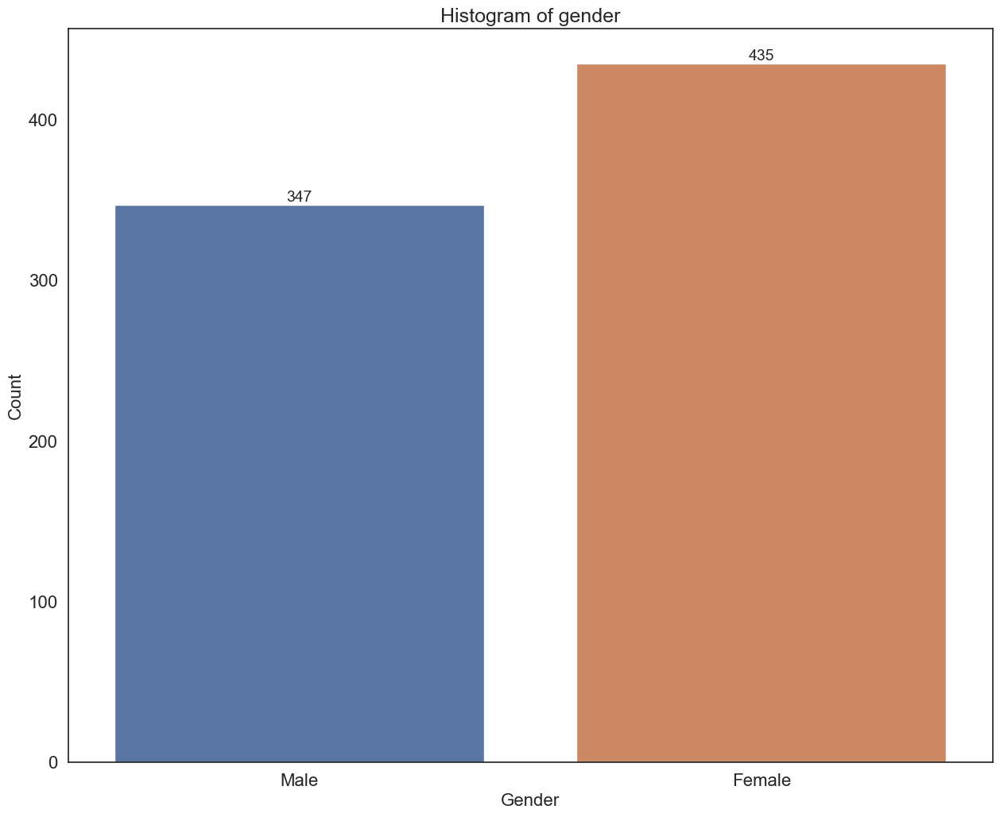

In [26]:
#Explore the "gender" variable with a countplot

#Set default figure size before calling Seaborn for the first time
sns.set(rc={"figure.figsize":(15, 12)})
#Force white background with no grid by default
sns.set_style("white")

countplot(series=customers,x="gender",title="Histogram of gender",x_label="Gender",y_label="Count",save_filename="gender_countplot.png")

It seems that the male gender is under-represented in the data.  Important to mention this but the imbalance is not perhaps large enough to be a concern.

In [28]:
print(f"The data contains {round((347/(347+435))*100,2)}% male and {round((435/(347+435))*100,2)} % female users")

The data contains 44.37% male and 55.63 % female users


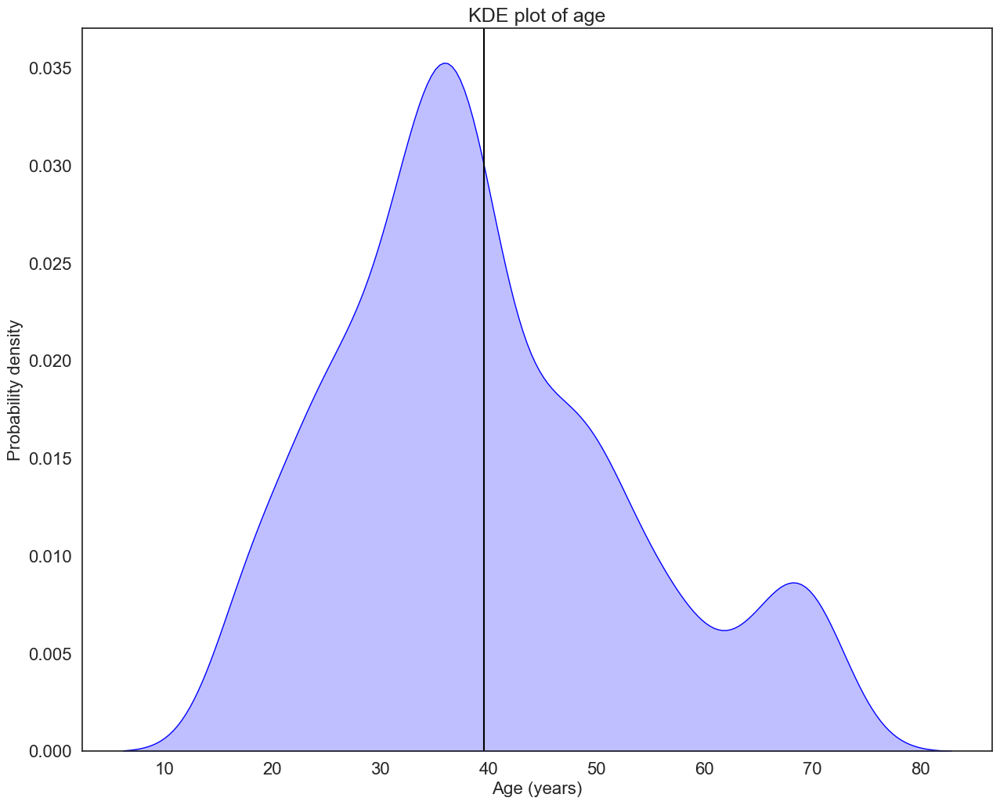

Basic stats for Age
Minimum 17
Maximum 72
Mean 39.55
Median 38.0
1st Quartile: 29.0
3rd Quartile: 49.0
IQR: 20.0
Population standard deviation: 13.66


In [29]:
#Explore the age variable and plot a KDE using our function

kdeplot(data=customers,colour="blue",fill=True,x="age",title="KDE plot of age",x_label="Age (years)",
        y_label="Probability density",mean=customers["age"].mean(),save_filename="age_kde")

printBasicStats(customers["age"],"Age")

The age is slightly right-skewed. We could say that a typical customer is late thirties but there are considerable numbers of older and new customers.  There are no obvious outliers to remove here.

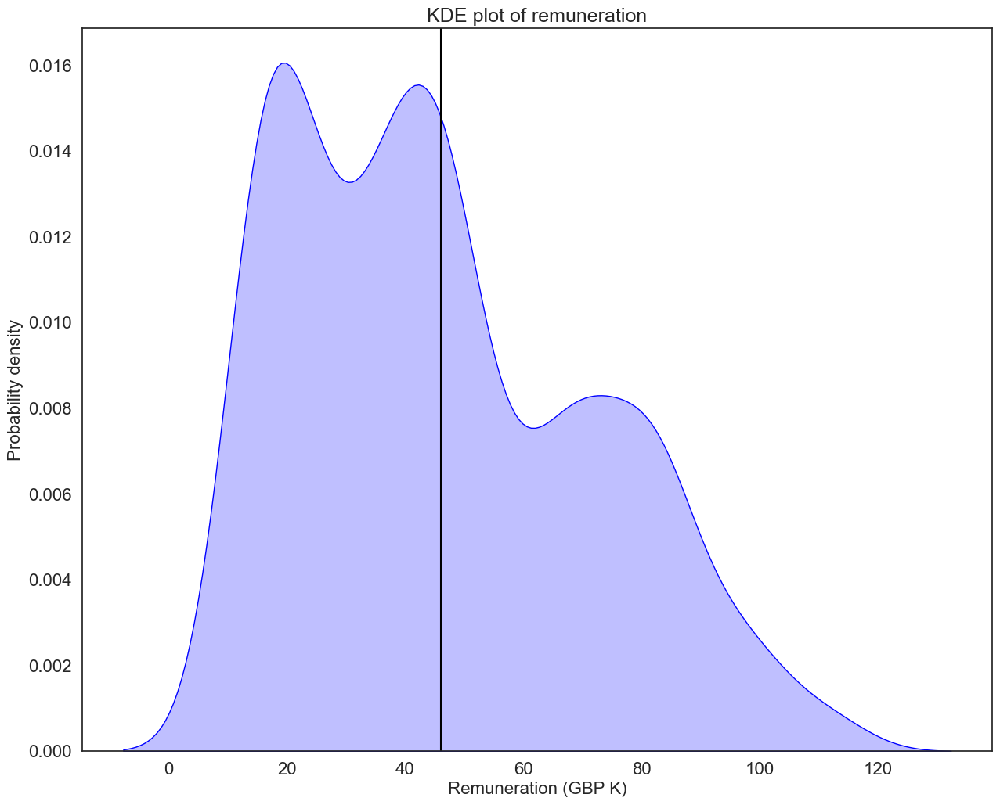

Basic stats for Remuneration
Minimum 12.3
Maximum 112.34
Mean 46.06
Median 44.28
1st Quartile: 23.16
3rd Quartile: 63.96
IQR: 40.8
Population standard deviation: 25.23


In [31]:
#Explore remuneration with a KDE plot

kdeplot(data=customers,colour="blue",fill=True,x="remuneration",title="KDE plot of remuneration",x_label="Remuneration (GBP K)",
        y_label="Probability density",mean=customers["remuneration"].mean(),save_filename="remuneration_kde")

printBasicStats(customers["remuneration"],"Remuneration")

Remuneration is slightly right-skewed.  The average customer is fairly wealthy with a salary of around 46K. 

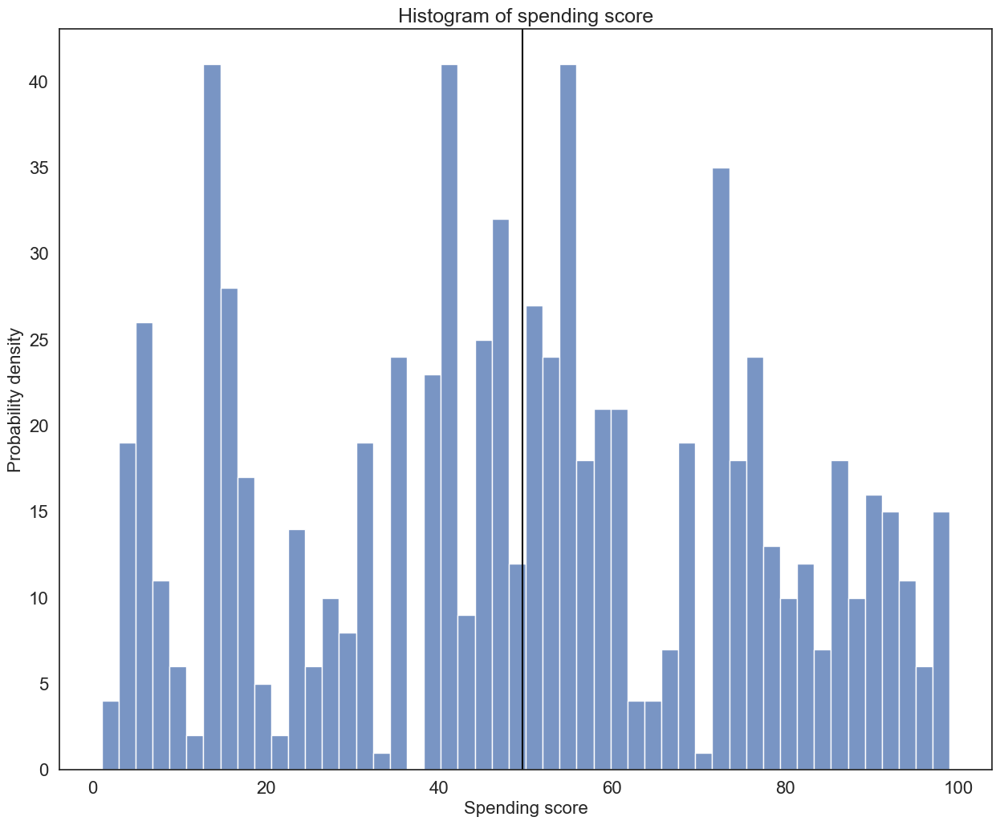

Basic stats for Spending score
Minimum 1
Maximum 99
Mean 49.6
Median 50.0
1st Quartile: 29.0
3rd Quartile: 73.0
IQR: 44.0
Population standard deviation: 26.58


In [33]:
#Explore spending score with a histogram

histplot(data=customers,bins=50,x="spending_score",title="Histogram of spending score",x_label="Spending score",
        y_label="Probability density",mean=customers["spending_score"].mean(),save_filename="kde_spending")

printBasicStats(customers["spending_score"],"Spending score")

Spending score has something like a normal distribution but with marked sub-peaks of "low" and "high" spenders.  No obvious problematic outliers.

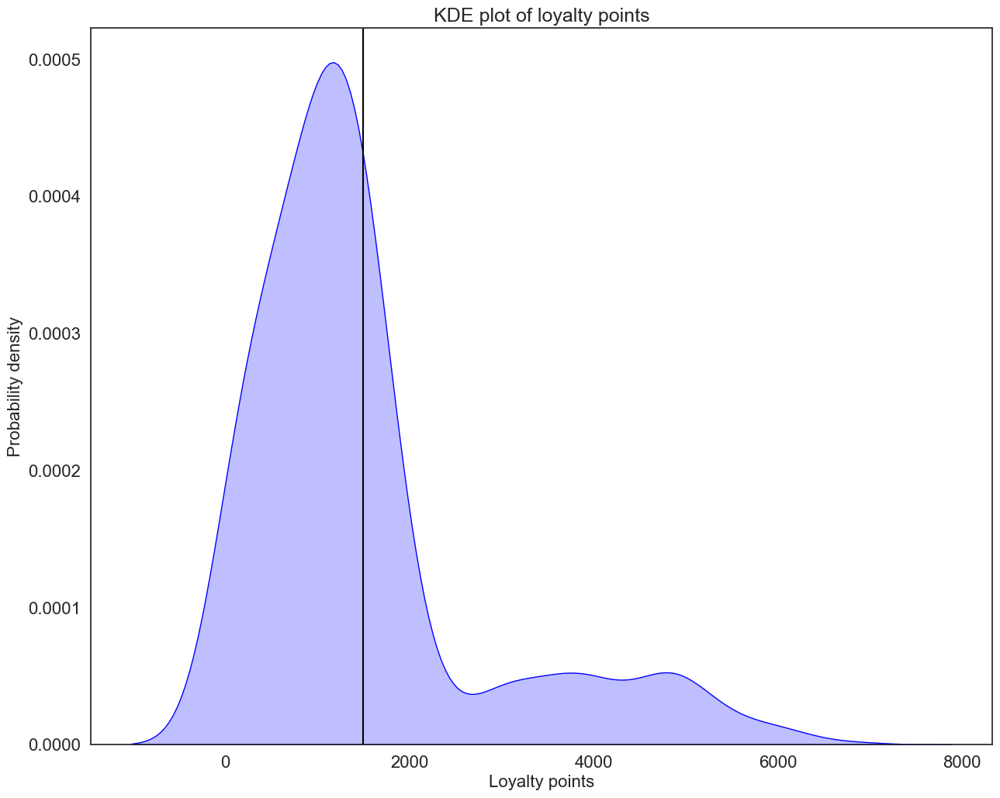

Basic stats for Loyalty Points
Minimum 25
Maximum 6847
Mean 1497.4
Median 1187.0
1st Quartile: 701.0
3rd Quartile: 1658.0
IQR: 957.0
Population standard deviation: 1312.4


In [35]:
#Explore loyalty points with a KDE plot

kdeplot(data=customers,colour="blue",fill=True,x="loyalty_points",title="KDE plot of loyalty points",x_label="Loyalty points",
        y_label="Probability density",mean=customers["loyalty_points"].mean(),save_filename="loyalty_kde")

printBasicStats(customers["loyalty_points"],"Loyalty Points")

Loyalty points is heavily right skewed. There are a small group of customers with very high scores and considerable potential to improve loyalty among low scoring customers.  While there are certainly some high outliers there is no rationale for their removal. Create a boxplot to see this in a different way.

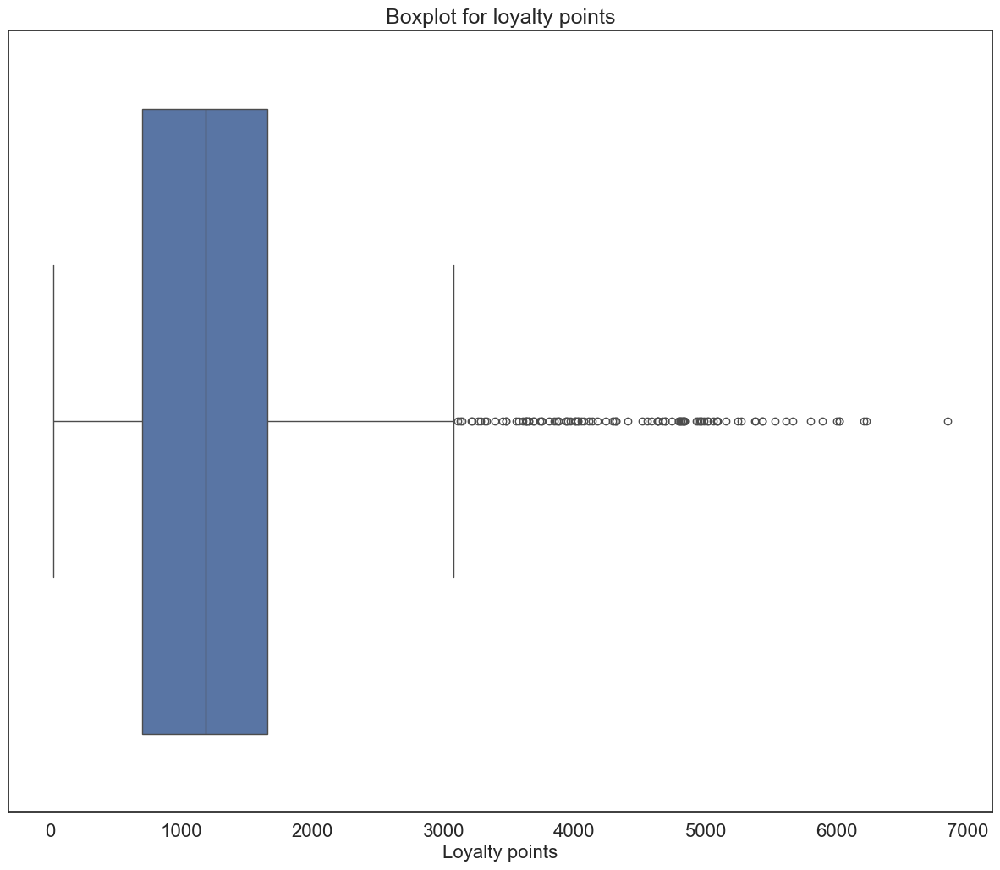

In [37]:
#Boxplot for loyalty points

boxplot(customers["loyalty_points"],title="Boxplot for loyalty points",y_label="",x_label="Loyalty points",orient="h",save_filename="loyalty_box")

There are a lot of outliers > 1.5 x IQR but these customers may well prove valuable to the analysis so the decision is to retain them in the dataset.

Finally, we will explore Education.

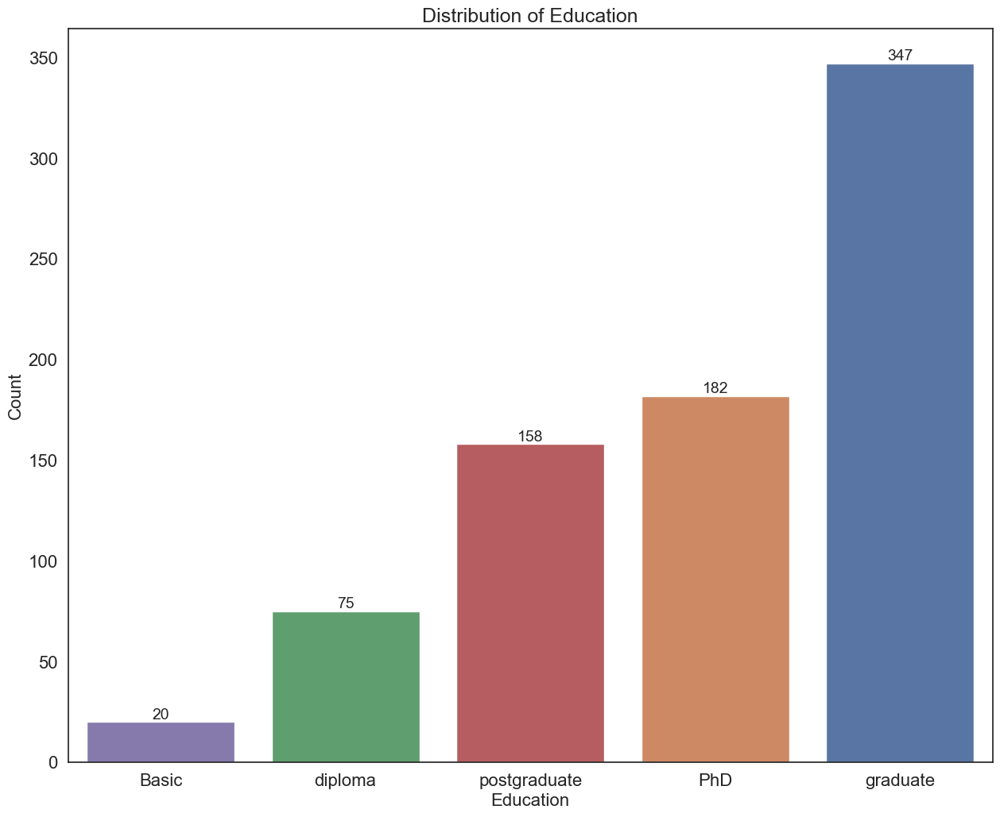

In [40]:
#Explore education with a countplot

countplot(series=customers,x="education",title="Distribution of Education",x_label="Education",y_label="Count",save_filename="education_hist")

We see that the vast majority of customers have a university education of some form.

## 6. Linear regression

We will use a pairplot to explore the data for potentially linear relationships.

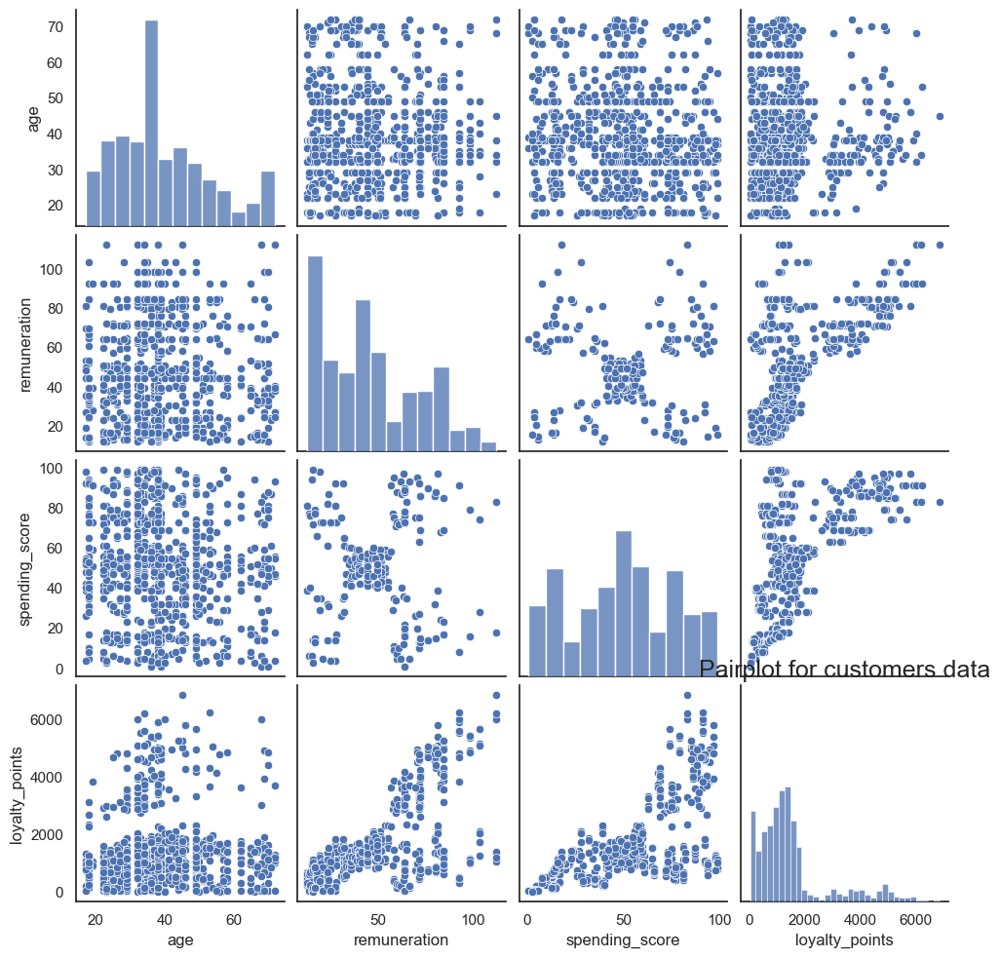

In [43]:
pairplot(customers,"Pairplot for customers data",save_filename="pairplot_all")

Visually we can see that remuneration and spending score show the clearest linear relationship to loyalty points,
with the possibility of a weaker trend for age.  Product will be ignored as it is a product code serving as an identifier.

In [45]:
#Show correlation matrix for numeric variables only
customers.corr(numeric_only=True)

,age,remuneration,spending_score,loyalty_points
age,1.000000,0.006024,-0.124630,0.028904
remuneration,0.006024,1.000000,-0.001645,0.630901
spending_score,-0.124630,-0.001645,1.000000,0.632116
loyalty_points,0.028904,0.630901,0.632116,1.000000


The correlation matrix supports the decision to explore spending score, remuneration as age and independent variables with 
loyalty points as the dependent variable in a linear regression model.

We will start with the simplest linear regression model i.e a single independent variable and assess the quality of the result.  We will use an 80/20 train/test split for all tests so a like-for-like comparison is made.  80/20 devotes the vast majority of the data for training while retaining a non-trivial amount for testing.

### 6a) spending vs loyalty

In [48]:
#Investigate spending score 

# Define independent variable
x_spending=customers["spending_score"]
# Define dependent variable
y=customers["loyalty_points"]

#Train/test split
x_train, x_test, y_train, y_test = train_test_split(x_spending, y,train_size=0.8,random_state=42)

#Fit model using the training set
spending_model=sm.OLS(y_train,sm.add_constant(x_train)).fit()

spending_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         loyalty_points   R-squared:                       0.402
Model:                            OLS   Adj. R-squared:                  0.401
Method:                 Least Squares   F-statistic:                     418.7
Date:                Sat, 19 Jul 2025   Prob (F-statistic):           1.44e-71
Time:                        10:20:37   Log-Likelihood:                -5209.1
No. Observations:                 625   AIC:                         1.042e+04
Df Residuals:                     623   BIC:                         1.043e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const            -63.2103     85.716     -0.737      0.461    -231.537     105.117
spending_score    31.2430      1.527     20.462      0.000      28.245      34.241
==============================================================================
Omnibus:                       71.510   Durbin-Watson:                   2.112
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              124.299
Skew:                           0.726   Prob(JB):                     1.02e-27
Kurtosis:                       4.633   Cond. No.                         119.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

The R squared or the proportion of the change in loyalty points that can be explained by the change in spending score is  40% which is poor.


Predict using the test set and determine the errors.

In [50]:
# Extract the predicted values from the test set
y_pred=spending_model.predict(sm.add_constant(x_test))

printErrors(observed=y_test,predicted=y_pred)

Mean Absolute Error: 730.5733412532984
Mean Square Error : 1107916.2227825932
RMS error minus MAE: 322.00265257450747


A mean error of 730 loyalty points is a lot compared to the loyalty points mean of 1497.  The RMS error is almost 50% larger indicating some bigger errors.

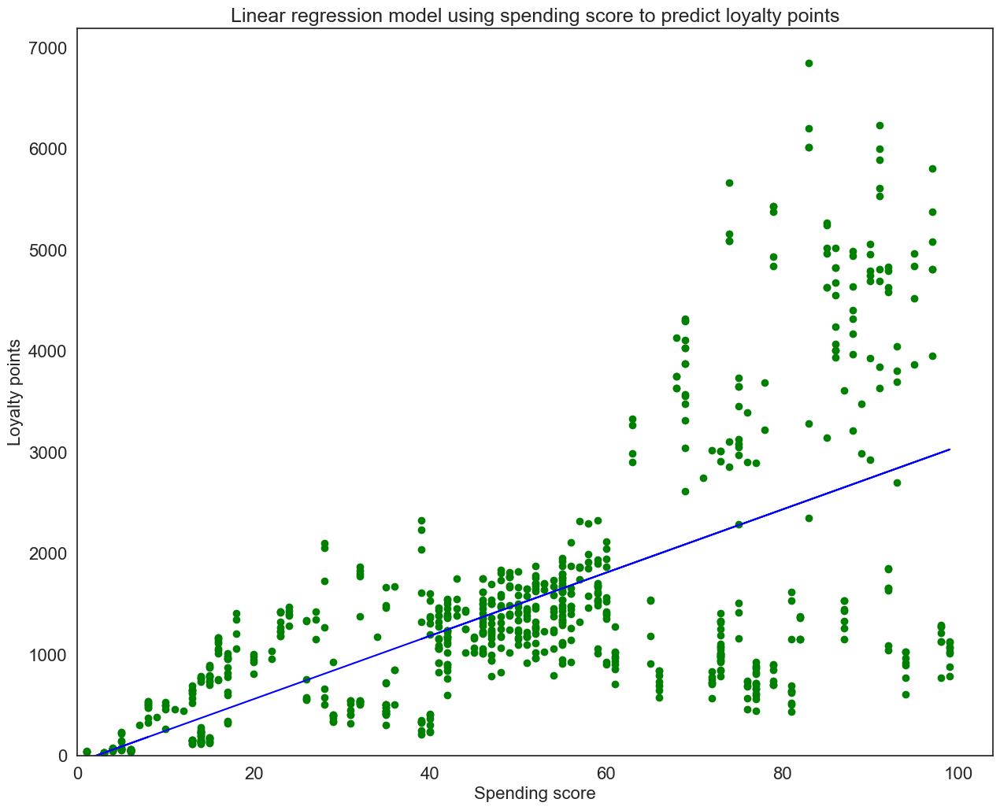

In [52]:
# Create the regression line for all the data and plot against the real data
y_regression_line=	-63.2103 + 31.24 * x_spending

# Plot the original data and show the regression line
scatterplot(x_spending,y,y_regression_line,plotLine=True,colour="green",line_colour="blue",
            title="Linear regression model using spending score to predict loyalty points",x_label="Spending score",y_label="Loyalty points", 
            save_filename="spending__linreg.png")

The regression model using spending score along is not a good fit, particularly for larger values.  However spending score clearly does have some influence.

### 6b) renumeration vs loyalty

In [55]:
# Define independent variable, y remains=loyalty points
x_remun=customers["remuneration"]

#Train/test split
x_train, x_test, y_train, y_test = train_test_split(x_remun, y,train_size=0.8,random_state=42)

#Fit model using the training set
remun_model=sm.OLS(y_train,sm.add_constant(x_train)).fit()

remun_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         loyalty_points   R-squared:                       0.393
Model:                            OLS   Adj. R-squared:                  0.392
Method:                 Least Squares   F-statistic:                     404.1
Date:                Sat, 19 Jul 2025   Prob (F-statistic):           1.17e-69
Time:                        10:20:52   Log-Likelihood:                -5213.5
No. Observations:                 625   AIC:                         1.043e+04
Df Residuals:                     623   BIC:                         1.044e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           -7.8268     84.615     -0.092      0.926    -173.992     158.338
remuneration    32.7199      1.628     20.103      0.000      29.524      35.916
==============================================================================
Omnibus:                       19.155   Durbin-Watson:                   2.046
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               32.091
Skew:                           0.219   Prob(JB):                     1.08e-07
Kurtosis:                       4.020   Cond. No.                         108.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

The R2 is again lower, with only 39% of the variation in loyalty points explained by variation in remuneration indicating a poor fit.  The standard error of the constant term is again high and the associated p-value is greater than 0.05. This suggests a high degree of uncertainty around the value of the intercept.

In [57]:
# Extract the predicted values from the test set
y_pred=remun_model.predict(sm.add_constant(x_test))

printErrors(observed=y_test,predicted=y_pred)

Mean Absolute Error: 717.6727802181326
Mean Square Error : 1063251.1372661116
RMS error minus MAE: 313.46791690622763


The errors are too high to be happy with a model using only remuneration.  Again the MAE is high compared to the mean of loyalty points and the RMS error indicates some larger errors.

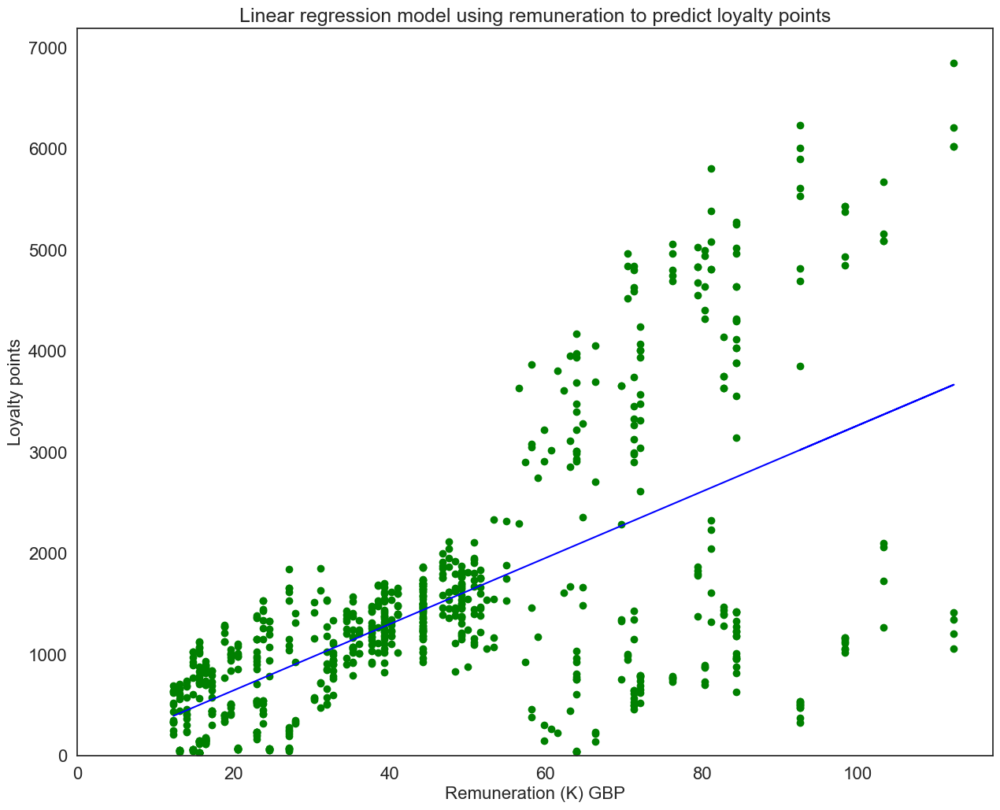

In [59]:
# Create the regression line for all the data and plot against the real data for the remuneration only model
y_regression_line=	-7.8268 + 32.7199 * x_remun

# Plot the original data and show the regression line
scatterplot(x_remun,y,y_regression_line,plotLine=True,colour="green",line_colour="blue",
            title="Linear regression model using remuneration to predict loyalty points",x_label="Remuneration (K) GBP",y_label="Loyalty points",
           save_filename="remun_linreg.png")


It is easy to this that this model also shows a poor fit for higher values.  Remuneration alone is not a strong enough predictor.

### 6c) age vs loyalty

In [62]:
# Define independent variable, we already have our y
x_age=customers["age"]

#Train/test split
x_train, x_test, y_train, y_test = train_test_split(x_age, y,train_size=0.8,random_state=42)

#Fit model using the training set
age_model=sm.OLS(y_train,sm.add_constant(x_train)).fit()

age_model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         loyalty_points   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.420
Date:                Sat, 19 Jul 2025   Prob (F-statistic):              0.234
Time:                        10:21:04   Log-Likelihood:                -5369.0
No. Observations:                 625   AIC:                         1.074e+04
Df Residuals:                     623   BIC:                         1.075e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1301.2766    161.903      8.037      0.000     983.335    1619.219
age            4.6353      3.890      1.191      0.234      -3.005      12.275
==============================================================================
Omnibus:                      191.865   Durbin-Watson:                   2.158
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              432.707
Skew:                           1.658   Prob(JB):                     1.09e-94
Kurtosis:                       5.372   Cond. No.                         129.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

The R2 is 1% and the standard error of the coefficient terms is very high.  It seems unlikely we will 
take age forward as a predictor.  We will see it through for completeness.

In [64]:
# Extract the predicted values from the test set
y_pred=remun_model.predict(sm.add_constant(x_test))

printErrors(observed=y_test,predicted=y_pred)

Mean Absolute Error: 972.5565824858213
Mean Square Error : 2152812.4567261785
RMS error minus MAE: 494.68997372965623


The errors are far to high to accept.

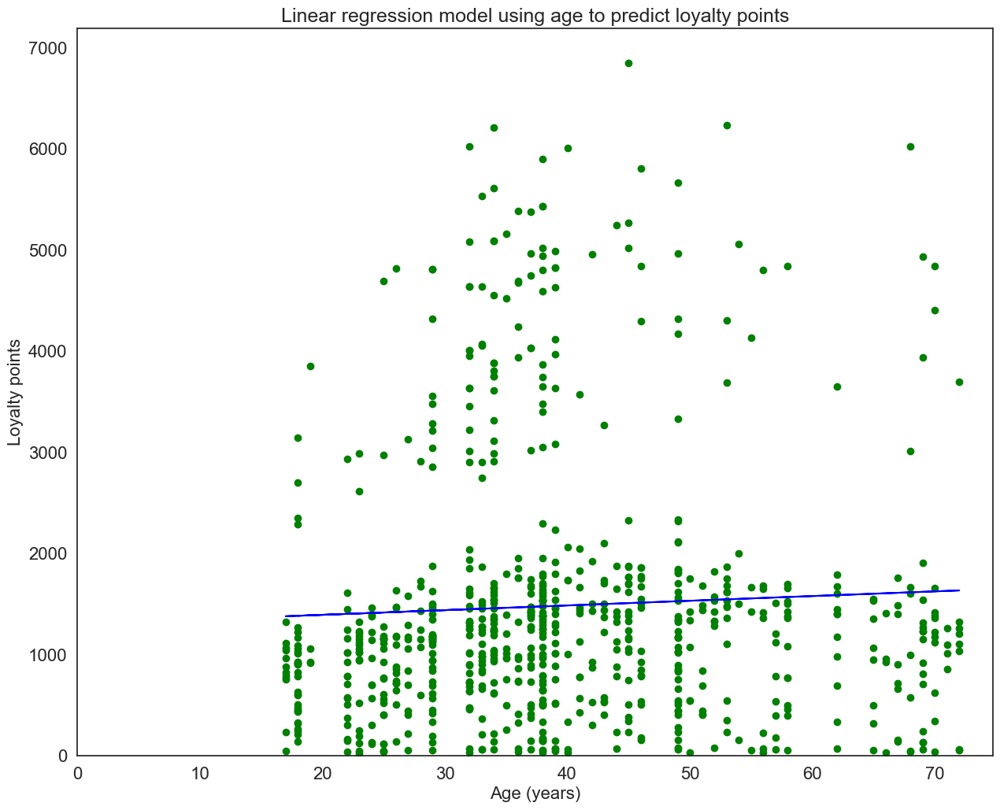

In [66]:
# Create the regression line for all the data and plot against the real data for the age model
y_regression_line=	1301.2766 + 4.6353* x_age

# Plot the original data and show the regression line
scatterplot(x_age,y,y_regression_line,plotLine=True,colour="green",line_colour="blue",
            title="Linear regression model using age to predict loyalty points",x_label="Age (years)",y_label="Loyalty points",
           save_filename="age_linreg.png")


A very weak relationship is shown between age and loyalty points and we will therefore not take age forward.

As both spending score and remuneration both seemed reasonably accurate at predicting lower values of loyalty points, 
we will investigate a multiple linear regression model using both as predictors.

In [68]:
#Multiple linear regression model

#Declare independent variables, we already have our y/dependent variable
X=customers[['spending_score','remuneration']]

#Train test split 80/20
X_train,X_test,y_train,y_test=train_test_split(X,y,train_size=0.8,random_state=42)

#Fit the model to the training set
multi_model=sm.OLS(y_train,sm.add_constant(X_train)).fit()

multi_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         loyalty_points   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.799
Method:                 Least Squares   F-statistic:                     1241.
Date:                Sat, 19 Jul 2025   Prob (F-statistic):          7.55e-218
Time:                        10:21:18   Log-Likelihood:                -4867.4
No. Observations:                 625   AIC:                             9741.
Df Residuals:                     622   BIC:                             9754.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -1571.0646     65.631    -23.938      0.000   -1699.950   -1442.179
spending_score    31.4072      0.885     35.507      0.000      29.670      33.144
remuneration      32.8955      0.936     35.135      0.000      31.057      34.734
==============================================================================
Omnibus:                        5.178   Durbin-Watson:                   2.081
Prob(Omnibus):                  0.075   Jarque-Bera (JB):                4.995
Skew:                           0.204   Prob(JB):                       0.0823
Kurtosis:                       3.158   Cond. No.                         202.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

The R squared score is much improved at 80% with a multiple model against the training data. We will predict using the test set.

In [70]:
#Build the predicted values
y_pred=multi_model.predict(sm.add_constant(X_test))

#Extract the R squared for the test set
print("Test set R squared:",metrics.r2_score(y_test,y_pred))

printErrors(observed=y_test,predicted=y_pred)

Test set R squared: 0.7958213909931171
Mean Absolute Error: 485.272698706688
Mean Square Error : 370379.8428155307
RMS error minus MAE: 123.31570310157082


While the test set shows an R squared of 79% the mean error of 485 loyalty points remains quite high. However it is lower than single variables and the RMS difference is notably lower.  Plot the residuals to see if there is a pattern as visualising three dimensions is going to be tricky.

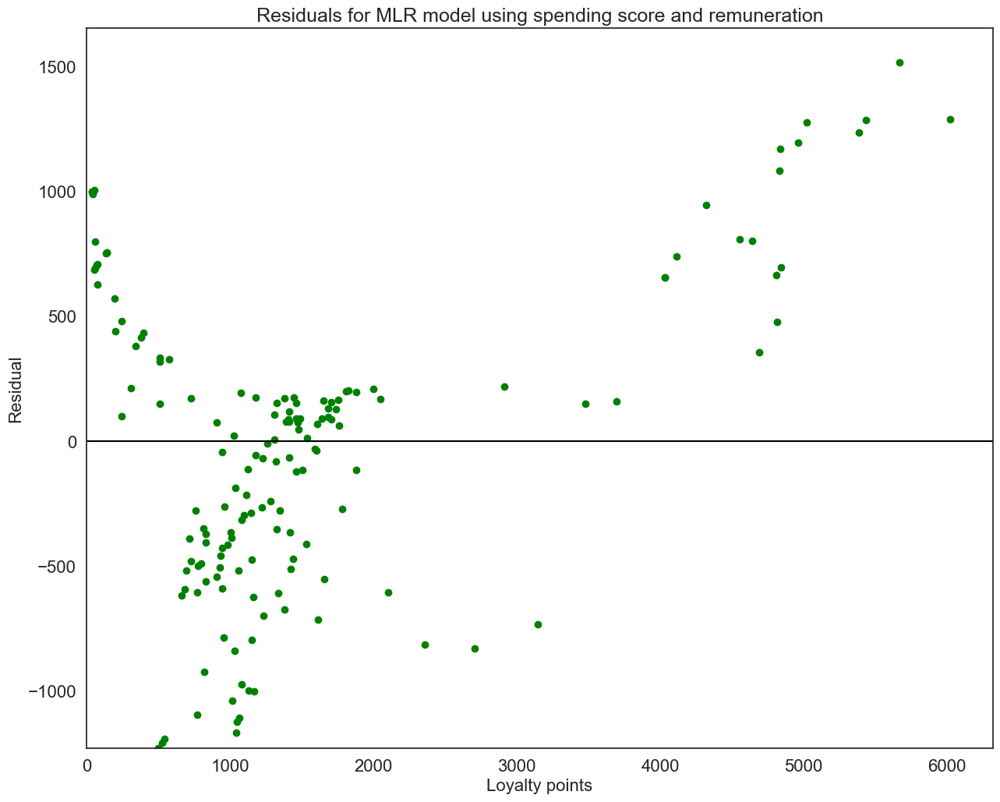

In [72]:
residuals=(y_test-y_pred).values

scatterplot(y_test,residuals,y_pred=None,plotLine=False,colour="green",line_colour="",
            title="Residuals for MLR model using spending score and remuneration",x_label="Loyalty points",
            y_label="Residual",y_lim=np.min(residuals),add_hline=True)

There is an obvious pattern in the residuals and the scattering is in no way random.  We will try log transforming the loyalty points to see if this
improves the model.

In [74]:
#Add new fields to the dataframe with the log of our dependent variable.
customers["loyalty_points_log"]=np.log(customers["loyalty_points"])

#Redefine the dependent variable
y=customers["loyalty_points_log"]

#fit model
#Train test split 80/20
X_train,X_test,y_train,y_test=train_test_split(X,y,train_size=0.8,random_state=42)

log_model=sm.OLS(y_train,sm.add_constant(X_train)).fit()
log_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     loyalty_points_log   R-squared:                       0.816
Model:                            OLS   Adj. R-squared:                  0.815
Method:                 Least Squares   F-statistic:                     1375.
Date:                Sat, 19 Jul 2025   Prob (F-statistic):          4.70e-229
Time:                        10:21:18   Log-Likelihood:                -396.45
No. Observations:                 625   AIC:                             798.9
Df Residuals:                     622   BIC:                             812.2
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              4.3797      0.051     85.320      0.000       4.279       4.481
spending_score     0.0286      0.001     41.410      0.000       0.027       0.030
remuneration       0.0237      0.001     32.403      0.000       0.022       0.025
==============================================================================
Omnibus:                      150.776   Durbin-Watson:                   2.086
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              351.451
Skew:                          -1.262   Prob(JB):                     4.82e-77
Kurtosis:                       5.670   Cond. No.                         202.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

The R squared value is slightly better at around 82% with the training set.  Predict the test set and assess.

In [76]:
#Build the predicted values.  We must take e to the power of predicted y to get the actual values
y_pred=np.exp(log_model.predict(sm.add_constant(X_test)))
y_test=np.exp(y_test)

#Extract the metrics/errors
print("Test set R squared:",metrics.r2_score(y_test,y_pred))

printErrors(observed=y_test,predicted=y_pred)

Test set R squared: 0.2862138944463918
Mean Absolute Error: 609.5443960897893
Mean Square Error : 1294807.4573764151
RMS error minus MAE: 528.3516700675794


The R squared is now considerably worse and the errors are higher.  We will try taking the logarithm of the independent variables as well so a log -log model.

In [78]:
#Add logs of spending score/remuneration
customers["spending_score_log"]=np.log(customers["spending_score"])
customers["remuneration_log"]=np.log(customers["remuneration"])

#Change independent variables
X=customers[["spending_score_log","remuneration_log"]]

#80/20 train/test split
X_train,X_test,y_train,y_test=train_test_split(X,y,train_size=0.8,random_state=42)

#Fit model and print summary
log_model=sm.OLS(y,sm.add_constant(X)).fit()
log_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     loyalty_points_log   R-squared:                       0.983
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                 2.187e+04
Date:                Sat, 19 Jul 2025   Prob (F-statistic):               0.00
Time:                        10:21:19   Log-Likelihood:                 423.45
No. Observations:                 782   AIC:                            -840.9
Df Residuals:                     779   BIC:                            -826.9
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.4655      0.037    -12.468      0.000      -0.539      -0.392
spending_score_log     0.9900      0.006    164.328      0.000       0.978       1.002
remuneration_log       1.0186      0.008    121.134      0.000       1.002       1.035
==============================================================================
Omnibus:                      194.853   Durbin-Watson:                   1.961
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              370.498
Skew:                          -1.468   Prob(JB):                     3.53e-81
Kurtosis:                       4.657   Cond. No.                         40.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

The R squared is very high at 98% for the training set.  Evaluate the test set performance as this is more important

In [80]:
#Build the predicted LOG values.  We must take e to the power of predicted y to get the actual values
y_pred=log_model.predict(sm.add_constant(X_test))

#Extract the R squared
print("Test set R squared:",metrics.r2_score(y_test,y_pred))

#y_pred is actually the log of the loyalty points.  Extract the real values with the exponential function so we can meaningfully compare the errors
y_pred_real=np.exp(y_pred)
#Similarly for y_test
y_test_real=np.exp(y_test)

printErrors(observed=y_test_real,predicted=y_pred_real)

Test set R squared: 0.9821674538120191
Mean Absolute Error: 167.14340860105128
Mean Square Error : 77689.31883038185
RMS error minus MAE: 111.58462879451079


The R squared is again close to 98%.  The p-values for the t-statistic for the co-efficients are zero.  The mean absolute error
is much lower at 167 vs 609 for the previous linear-log model. This looks better but the difference between the RMS error and the MAE suggests some larger errors still exist.

We will review all the constraints/assumptions of linear regression.

From https://statisticsbyjim.com/regression/ols-linear-regression-assumptions/

- The regression model is linear in the coefficients and the error term.  This is inherent in the model itself and we cannot "check" it, other than to say the R squared and reasonable error we have derived indicate this to be a good assumption.  As the model is multiple regression plotting the line is harder.  3D charts dont look so good.

- The error term has a population mean of zero.  The inclusion of the constant term forces this to be the case according to https://statisticsbyjim.com/regression/interpret-constant-y-intercept-regression/

- All independent variables are uncorrelated with the error term...so does the residual correlate to either log(spending score) or log(remuneration).  We will check this with a simple scatterplot.

Mean residual:  0.0074997772151688775


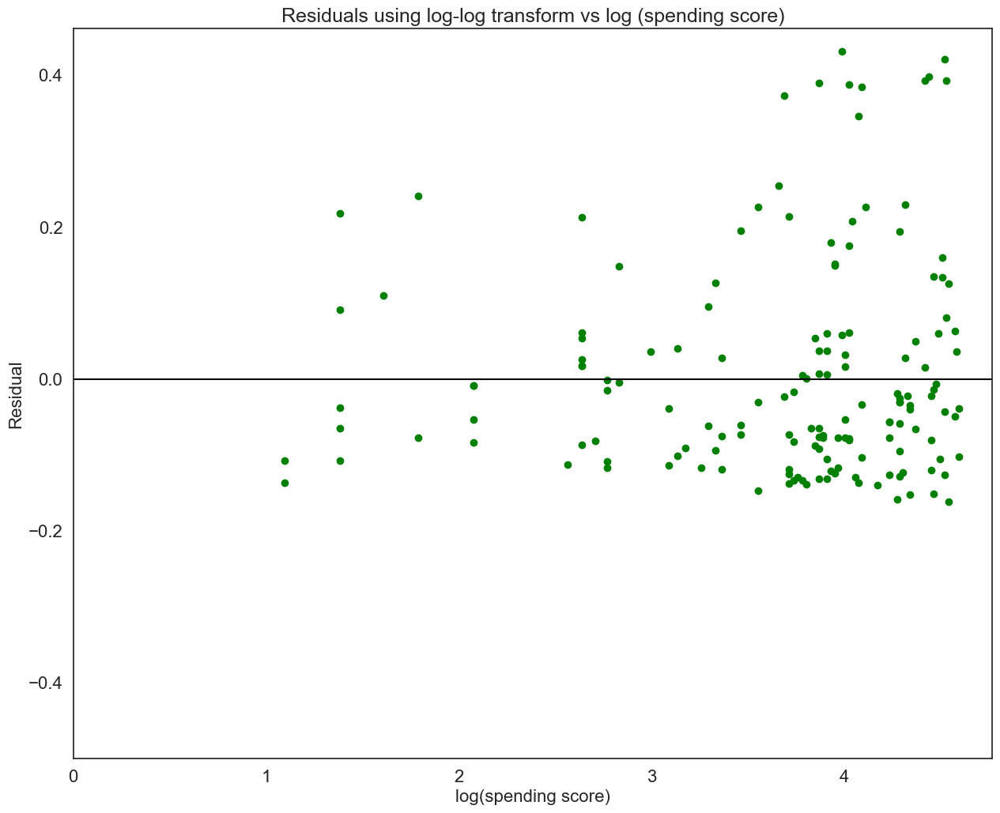

In [82]:
#Plot the residuals against spending score log
residuals=y_pred-y_test

#Print the mean

print("Mean residual: ",np.mean(residuals))

#Indicate to scatter plot we just want a scatterplot with a line at 0 to show an x axis

scatterplot(X_test["spending_score_log"],residuals,y_pred=None,plotLine=False,colour="green",line_colour="",
            title="Residuals using log-log transform vs log (spending score)",
            x_label="log(spending score)",y_label="Residual",y_lim=-0.5,add_hline=True)

The residuals do not appear to be correlated with log(spending score). The mean residual value is pretty close to zero. Repeat for remuneration.

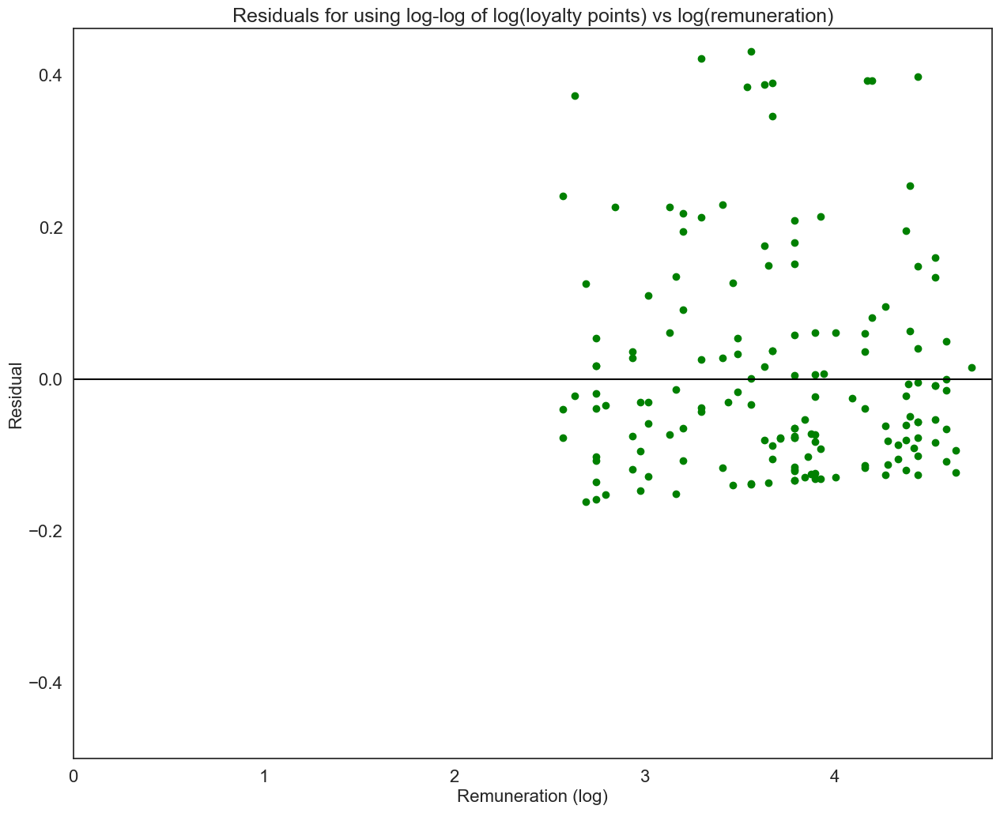

In [84]:
scatterplot(X_test["remuneration_log"],residuals,y_pred=None,plotLine=False,colour="green",line_colour="",
            title="Residuals for using log-log of log(loyalty points) vs log(remuneration)",
            x_label="Remuneration (log)",y_label="Residual",y_lim=-0.5,add_hline=True)

Again the residuals do not appear to be correlated with the value of log (remuneration).  We can say that the assumption is valid.

The next assumption is - observations of the error term are uncorrelated with each other i.e there is no autocorrelation.  We will perform a Durbin-Watson test.


In [86]:
#Calculate Durbin-Watson statistic
dw = durbin_watson(log_model.resid)
print(f"Durbin-Watson statistic: {dw}")

Durbin-Watson statistic: 1.9608103221965305


The result is very close to 2 so we will assume negligible autocorrelation.

The next assumption is that the error term has a constant variance (no heteroscedasticity).  We will scatterplot the residuals

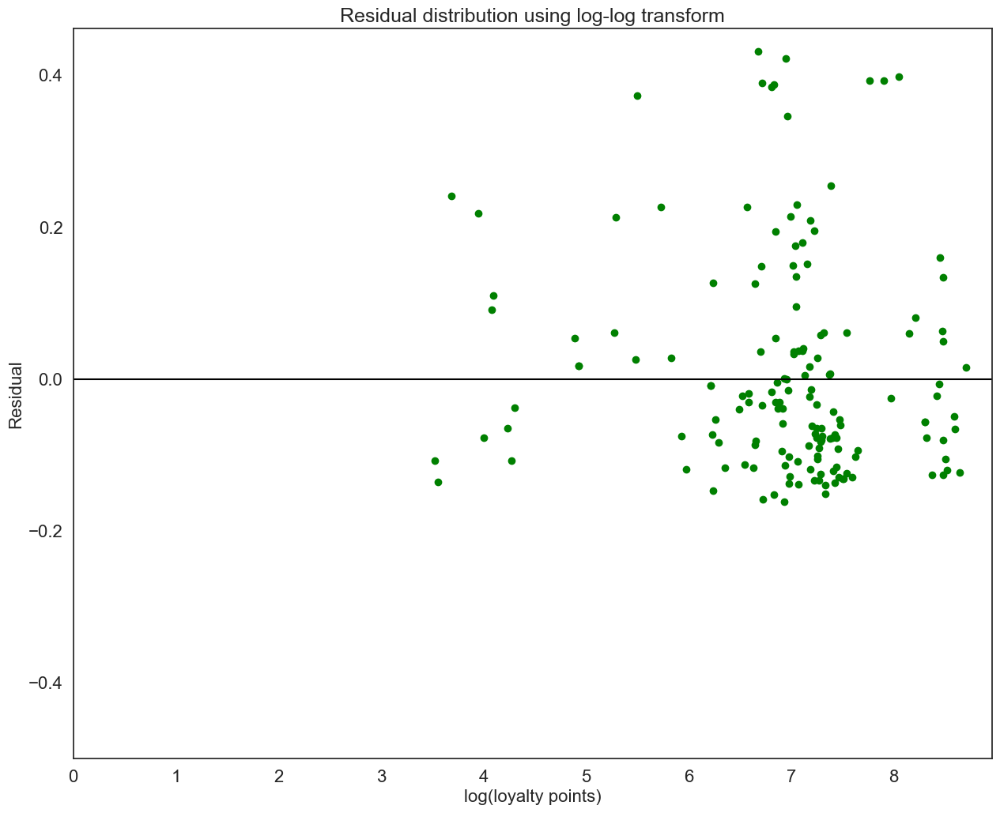

In [88]:
scatterplot(y_test,residuals,y_pred=None,plotLine=False,colour="green",line_colour="",
            title="Residual distribution using log-log transform",
            x_label="log(loyalty points)",y_label="Residual",y_lim=-0.5,add_hline=True)

There does seem to be more residuals below the line, but these tend to have a smaller magnitude.  We will perform a Breusch-Pagan test.

In [90]:
bp_test=sms.het_breuschpagan(log_model.resid, log_model.model.exog)

terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms, bp_test)))

{'LM stat': 1.8037474256844472, 'LM Test p-value': 0.4058085781946851, 'F-stat': 0.9004908957021444, 'F-test p-value': 0.4067926966755351}


As the p-value is greater than 0.0.5 we can reject the null hpothesis and assume no heteroscedasticity.

The next assumption is no independent variable is a perfect linear function of other explanatory variables i.e no multicollinearity.  We will calculate the VIF (variance inflation factor).

In [92]:
vif=pd.DataFrame()

x_temp=sm.add_constant(X_train)

vif['VIF factor']=[variance_inflation_factor(x_temp.values,i) for i in range(x_temp.values.shape[1])]

vif['features']=x_temp.columns

vif.round(2)

,VIF factor,features
0,54.79,const
1,1.00,spending_score_log
2,1.00,remuneration_log


As the VIF is 1 for both features this suggests no multicollinearity.  
As the pairplot did not show a linear relationship either we can feel comfortable with this.  The final assumption is that the error term is normally distributed.  We will take a q-q plot of the residuals.

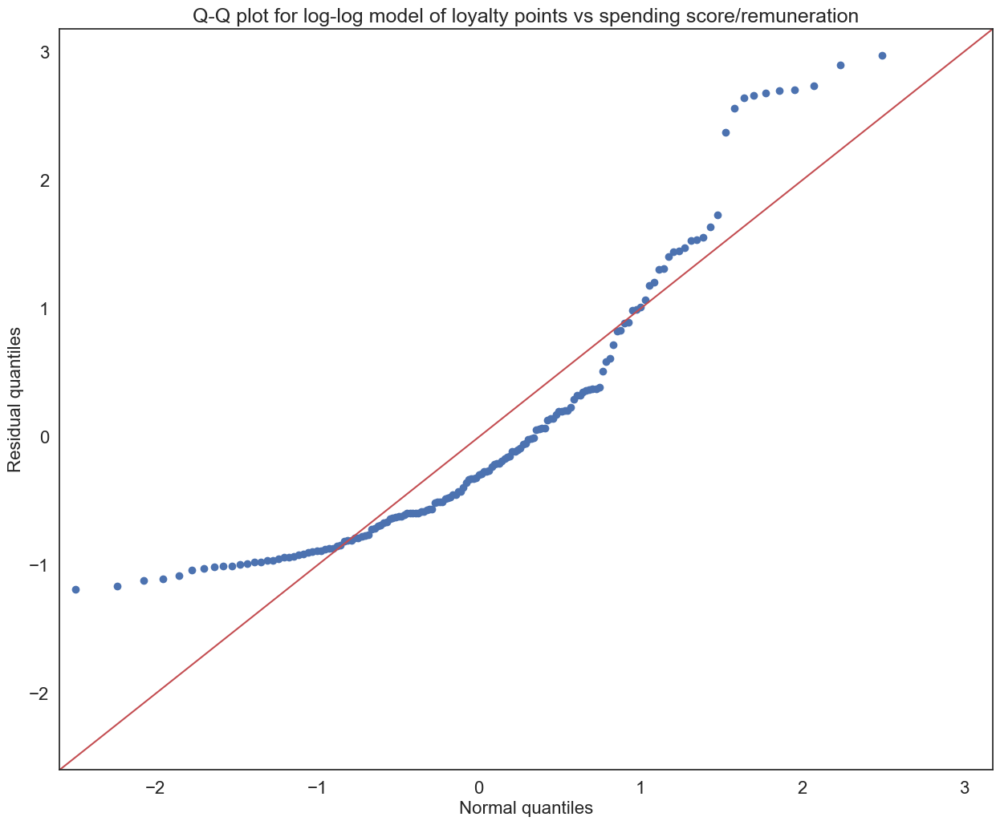

In [94]:
#Use q-q plot to show the residuals
qqplot(data=residuals,x_label="Normal quantiles",y_label="Residual quantiles",
       title="Q-Q plot for log-log model of loyalty points vs spending score/remuneration",save_filename="qqlog_resid_linreg.png")

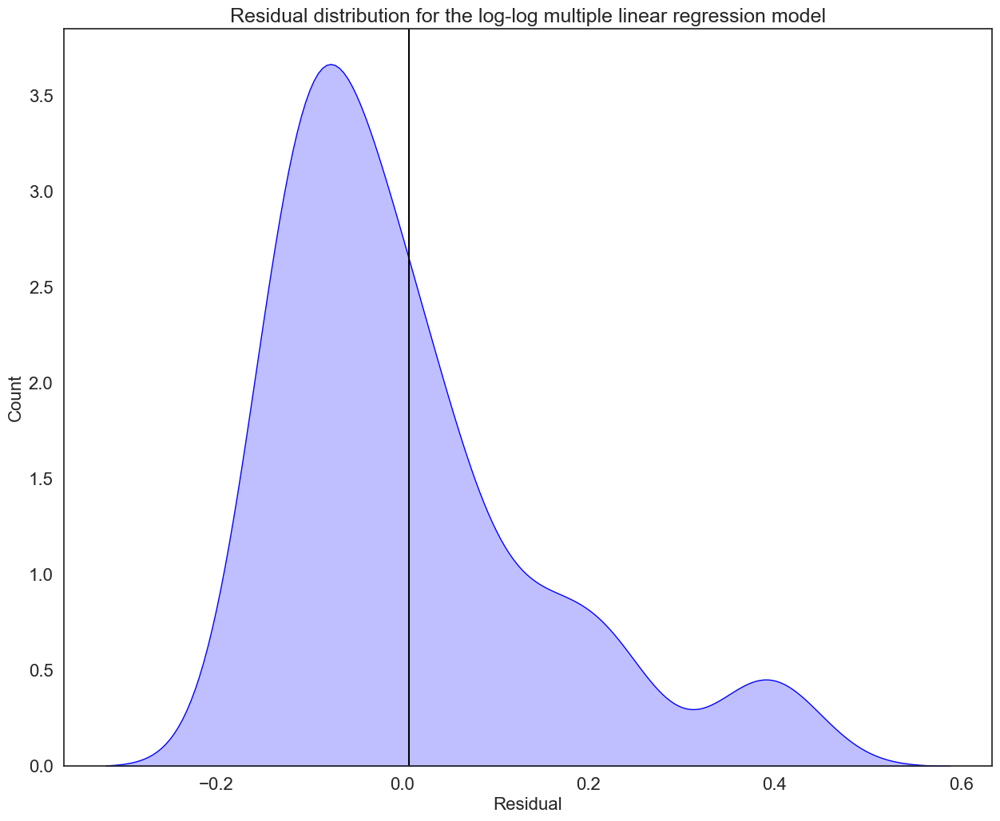

In [95]:
#Plot a histogram to illustrate the residual distribution differently

#Create residuals as dataframe so we can re-use uour function
res_df=pd.DataFrame(residuals,columns=["residual"])

kdeplot(res_df,x="residual",title="Residual distribution for the log-log multiple linear regression model",
        x_label="Residual",y_label="Count",mean=np.mean(res_df["residual"]))

There is some deviation from a normal distribution in the residuals. However according to https://statisticsbyjim.com/regression/ols-linear-regression-assumptions/ this is not a "deal breaker" for a linear regression unless we wish to use our model for hypothesis testing.

This is a limitation we should remain aware of however.

## 7. Observations and insights from linear regression models.

Our conclusion is that the log-log model of log(loyalty points)=-0.4655 + 0.99(log(spending score)) + 1.0186(log(remuneration)) has some positive indications such as the high R2 and reasonable errors but we must bear in mind that the residuals deviate somewhat from a normal distribution.

The simpler single independent variable regressions show that at higher values, the scatter plot "splits" around a regression line and that there may be a high spending score/low loyalty group and a low spending score/low loyalty group, and similarly for remuneration.  This explains why the linear model may not be the ideal choice.

As both of our coefficients are very close to 1, the log-log model can be approximated as: 

<b> If there is a 1% increase in spending score AND a 1% increase in remuneration then that is associated with an approximate average increase of 1% in loyalty points.</b>

See [this](https://quantifyinghealth.com/interpret-log-transformations-in-linear-regression/) for the mathematical reasoning around this. 

# Decision tree regression analysis 

## 1. Respecify dependent and independent variables and "one hot" encode the categorical variables.

In [100]:
y=customers["loyalty_points"]

#Set independent variables as all other columns
X=customers.drop(["loyalty_points"],axis=1)

X.head()

,gender,age,remuneration,spending_score,education,loyalty_points_log,spending_score_log,remuneration_log
0,Male,18,12.30,39,graduate,5.347108,3.663562,2.509599
1,Male,23,12.30,81,graduate,6.261492,4.394449,2.509599
2,Female,22,13.12,6,graduate,3.688879,1.791759,2.574138
3,Female,25,13.12,77,graduate,6.331502,4.343805,2.574138
4,Female,33,13.94,40,graduate,5.902633,3.688879,2.634762


We will need to encode the gender and education categorical variables for the decision tree regression model.

In [102]:
gender_df=pd.get_dummies(X['gender'],prefix='gender')
X=X.join(gender_df)

#To avoid multicollinearity, drop the male column as female=False can be considered male as our data contains only two values for gender
X=X.drop(['gender_Male'],axis=1)

#Remove upper case to make things easier later....
X=X.rename(columns={'gender_Female':'gender_female'})
X.head()

,gender,age,remuneration,spending_score,education,loyalty_points_log,spending_score_log,remuneration_log,gender_female
0,Male,18,12.30,39,graduate,5.347108,3.663562,2.509599,False
1,Male,23,12.30,81,graduate,6.261492,4.394449,2.509599,False
2,Female,22,13.12,6,graduate,3.688879,1.791759,2.574138,True
3,Female,25,13.12,77,graduate,6.331502,4.343805,2.574138,True
4,Female,33,13.94,40,graduate,5.902633,3.688879,2.634762,True


In [103]:
#Handle education
education_df=pd.get_dummies(X['education'],prefix='edu')
X=X.join(education_df)

#Drop the edu_basic column to avoid multicollinearity..all educ columns=False means edu_basic.
X=X.drop("edu_Basic",axis=1)

In [104]:
#Make new columns all lower case
#X=X.rename(columns={"edu_PhD":"edu_phd"})

#Drop the original gender and education columns for this analysis, and the log columns are no longer needed
X=X.drop(["gender","education","loyalty_points_log","spending_score_log","remuneration_log"],axis=1)
X.head()

,age,remuneration,spending_score,gender_female,edu_PhD,edu_diploma,edu_graduate,edu_postgraduate
0,18,12.30,39,False,False,False,True,False
1,23,12.30,81,False,False,False,True,False
2,22,13.12,6,True,False,False,True,False
3,25,13.12,77,True,False,False,True,False
4,33,13.94,40,True,False,False,True,False


## 2. Create train and test data sets.

In [106]:
# Split the data into test and train data.
#We will use a similar split to the linear model so that comparison is as fair as possible
X_train,X_test,y_train,y_test=train_test_split(X,y,train_size=0.8,random_state=42)

## 3. Create, tune and evaluate Decision Tree Regressor models.

We will create a simple unpruned tree with no restrictions to determine the suitability of the model and feature importances.

In [109]:
# Create your decision tree regressor.
dtc=DecisionTreeRegressor()

#Fit to the training set
dtc.fit(X_train,y_train)

DecisionTreeRegressor()

In [110]:
# Evaluate the model.
y_pred=dtc.predict(X_test)

#Print the R squared and erros
print("R squared: ",metrics.r2_score(y_pred,y_test))
printErrors(observed=y_test,predicted=y_pred)


R squared:  0.9721745586223541
Mean Absolute Error: 120.63057324840764
Mean Square Error : 49399.59872611465
RMS error minus MAE: 101.62963175040596


The model performs very well on the test data with R squared 97% and acceptable errors, although the MAE and RMSE difference shows there are some larger errors.  We will now refine the model by assessing the feature importances and tuning hyperparametes.

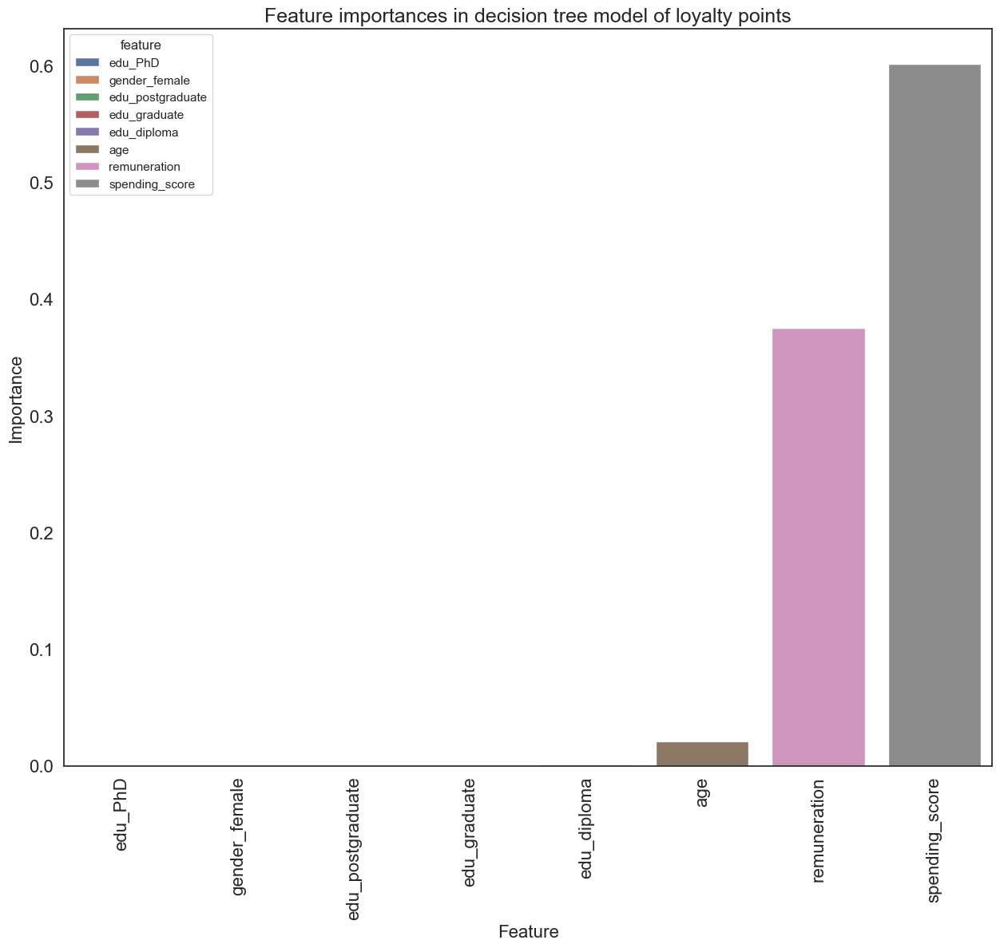

In [112]:
#Zip together the importances and the names of the features
importances = dtc.feature_importances_
feature_names=X.columns

importanceDict=dict(zip(feature_names,importances))

#Create a dataframe of the features and their importances so we can plot them
feature_df=pd.DataFrame().from_dict(importanceDict,orient='index',columns=['importance']).sort_values("importance")
feature_df=feature_df.reset_index(names=['feature','importance'])

barplot(data=feature_df,x='feature',y='importance',title="Feature importances in decision tree model of loyalty points",x_label="Feature",
      y_label="Importance",hue="feature",legend=True,save_filename="dtc_features.png",vertical_xLabels=True)

We see that only remuneration and spending score have any real importance so we will remove all other features.

In [114]:
X=X[["remuneration","spending_score"]]

#Reapply train/test split
X_train,X_test,y_train,y_test=train_test_split(X,y,train_size=0.8,random_state=42)

#Print the depth of the unpruned tree so we get a sense of how deep to go (or not)
print(f"Unpruned tree has depth:{dtc.get_depth()}")

Unpruned tree has depth:20


We will now use GridSearchCV to find the optimal combination of different values of some hyperparameters

In [116]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid to tune the hyperparameters. Each key in the dictionary is a list of values to test for the parameter
#We want as simple a tree as possible without sacrificing too much accuracy

#Define a dictionary with some test values of hyperparameters
#Min samples split - the minimum samples which must exist at a node before it can be split
#The minimum samples a leaf should contain

param_grid = {
    'max_depth': [2,3,4,5,6,7,8,9,10,11,12,13,14,15,20],
    'min_samples_split': [2,3,4,5,6,7,8,9,10,15,20,25,30],
    'min_samples_leaf': [2,3,5,10,15,20,25,30]
}

# Initialize a decision tree regressor
test_reg = DecisionTreeRegressor(random_state=42)

#Define the GridSearchCV object
#n_jobs=-1 indicates no limit on the parallel processing jobs created
# scoring='neg_mean_squared_error' instructs the method to use mean squared error as the criteria for deciding the best model

grid_search = GridSearchCV(estimator=test_reg, param_grid=param_grid, n_jobs=-1,  scoring='neg_mean_squared_error')

#Fit the model to the training data
grid_search.fit(X_train, y_train)

#Return the best performing model
best_reg = grid_search.best_estimator_ 

#Predict y (loyalty points) using the test set
y_pred = best_reg.predict(X_test)

#Print the R squared and errors
score=metrics.r2_score(y_pred,y_test)
print("R squared score:", score) 

printErrors(observed=y_test,predicted=y_pred)

#Print the best parameters the model found
best_params = grid_search.best_params_
print(f"Best parameters: {best_params}")


R squared score: 0.9517199035057873
Mean Absolute Error: 167.93128412192902
Mean Square Error : 96323.2956934746
RMS error minus MAE: 142.42866125355687
Best parameters: {'max_depth': 12, 'min_samples_leaf': 3, 'min_samples_split': 7}


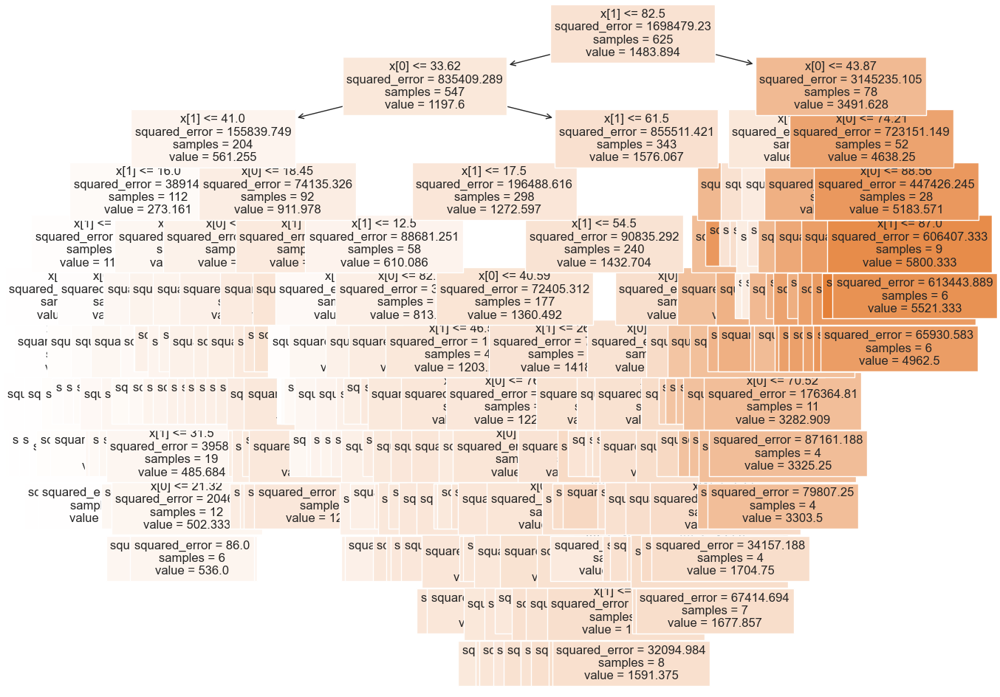

In [117]:
plot_tree(best_reg, filled=True, fontsize=12)
plt.show()

The optimal tree is very complex at 12 levels.  We will see whether the number of levels can be reduced without affecting the accuracy too much.

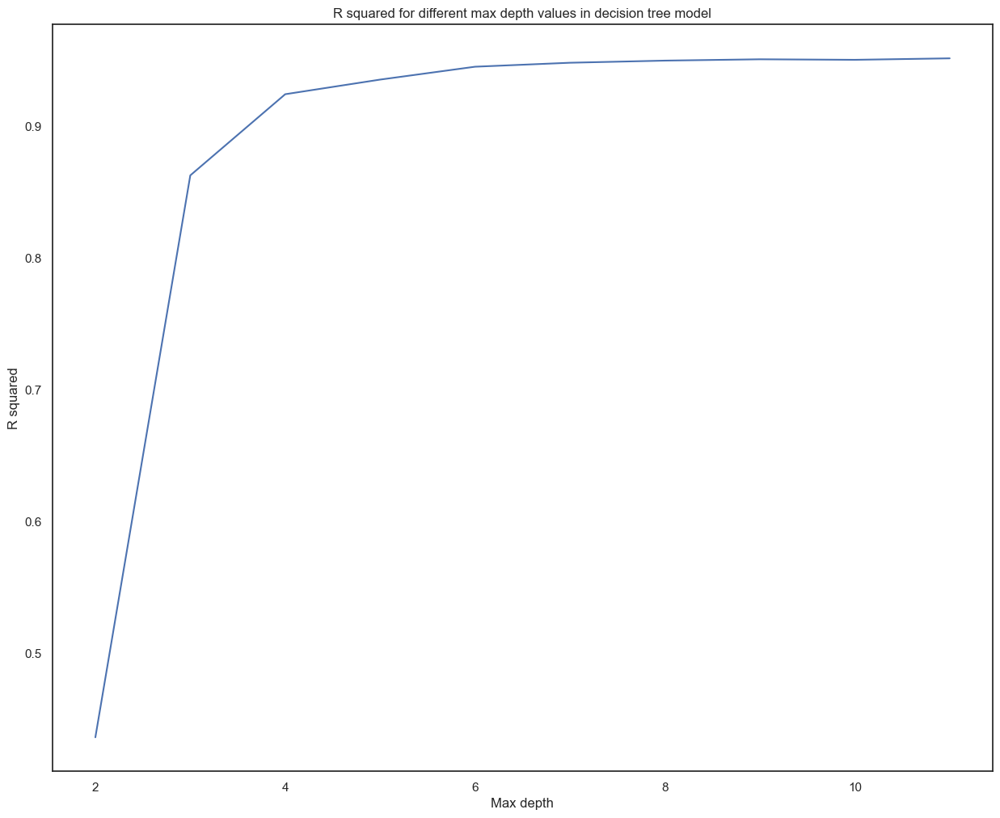

,accuracy
2,0.435997
3,0.862973
4,0.924649
5,0.935760
6,0.945546
7,0.948564
8,0.950182
9,0.951193
10,0.950793
11,0.951911


In [119]:
# List of values 2-12 to try for max_depth:
max_depth_range = list(range(2, 12))

# Loop around the max_depths, fitting a DecisionTreeRegressor for each one using the training data
accuracy = []
depths=[]

for depth in max_depth_range:    
    dtc_test = DecisionTreeRegressor(max_depth = depth, random_state = 42,min_samples_leaf=3,min_samples_split=7)
    dtc_test.fit(X_train, y_train)

    y_pred2=dtc_test.predict(X_test)
    score = metrics.r2_score(y_pred2, y_test)
    accuracy.append(score)
    depths.append(depth)

#Zip depths and accuracy and create a dictionary
zipped=dict(zip(depths,accuracy))

# Plot accuracy values across the range of depth values evaluated
plt.plot(zipped.keys(),zipped.values())
plt.title("R squared for different max depth values in decision tree model")
plt.xlabel("Max depth")
plt.ylabel("R squared")
plt.show()

accuracy = pd.DataFrame(accuracy)
#Turn zipped depths/accuracies into a dataframe for display
accuracyFrame=pd.DataFrame.from_dict(zipped, orient='index',columns=["accuracy"])

accuracyFrame

We will choose the value of 4 for max depth as this allows a more interpretable  tree while sacrificing only around 2% of the R squared value

## 4. Fit and plot final model and compare to a Random Forest model.

In [122]:
#Define the model with our tuned parameters and fit to the training data
dtc=DecisionTreeRegressor(max_depth=4,min_samples_split=7,min_samples_leaf=3)
dtc.fit(X_train,y_train)

#Predict from the test set
y_pred=dtc.predict(X_test)

#Print R squared and errors
print("R squared for final tree:",metrics.r2_score(y_pred,y_test))
printErrors(observed=y_test,predicted=y_pred)

R squared for final tree: 0.9246489801275108
Mean Absolute Error: 251.6505665418521
Mean Square Error : 142899.88037941032
RMS error minus MAE: 126.37043866739592


The final model shows acceptable errors but is not as good as the final linear regression model in this respect.  The RMS-MAE indicates some 
larger errors remain.  Plot the final tree.

In [124]:
#Plot the tree, adding the feature names for readability

fig, axes = plt.subplots(nrows = 1, ncols = 1,
                         figsize = (40,15), dpi=800)

plot_tree(dtc, filled=True, fontsize=12,feature_names=feature_names)
plt.title("Decision Tree: remuneration and spending score only, max_depth=4",fontsize=20)
plt.savefig("final_tree.png",dpi=800)
plt.show()

# We will now evaluate a random forest regressor to see if this gives an appreciable increase in accuracy.

In [126]:
from sklearn.ensemble import RandomForestRegressor 

# Create the regressor object.
regressor = RandomForestRegressor(random_state=42)

# Fit the regressor to the data set, and predict the y variable.
regressor.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [127]:
# Test using the test set
y_pred = regressor.predict(X_test) 

#Print the R squared and errors
print("Random forest R squared:",metrics.r2_score(y_pred,y_test))
printErrors(observed=y_test,predicted=y_pred)

Random forest R squared: 0.9599490057145158
Mean Absolute Error: 158.93874718487456
Mean Square Error : 77802.41247488356
RMS error minus MAE: 119.99209097197672


Although the R squared is only 4% higher at 96%, the MAE is considerably (36%) lower.  The difference between the RMS and the MAE is around the same so some larger errors still exist. However the random forest consists of an aggregation of decision trees, so we cannot generate a single plot which represents the model.  This makes the model harder to demonstrate to stakeholders.

## Insights and observations

The decision tree regression model can be said to predict loyalty points less accurately than the log-log linear regression model.  R squared 98% vs 92%, MAE 167 vs 251 , RMSE - MAE 111  vs 126.  A random forest regression model, with the R2 of 96% and a slightly lower MAE of 158 closes this gap to the point where the linear model is only very slightly more accurate.  However, whilst a single decision tree model could for instance be implemented as a set of rules in a spreadsheet or flowchart by a non-technical user, the random forest is limited to being used by someone able to run this notebook or a similar piece of Python code.  

The decision tree model could be implemented as a set of if...else statements in any application written in any language, whereas the random forest model is more opaque.

We can conclude that the log-log linear model gives the best combination of accuracy, simplicity and the ability to be explained to and be implemented by non-technical users.  It has a fairly simple explanation and involves a calculation could be carried out on a calculator or in a spreadsheet by any numerate person.

## We would therefore recommend that the log-log linear model be used for any predictive purposes.

# Cluster analysis of customers using the spending score and remuneration features

The goal is to better understand the distribution of customers by spending score and remuneration to determine whether any clusters can be mapped to "buyer personas" we are seeking to establish as per the project directives

## Instructions
1. Prepare the data for clustering. 
    1. Import the CSV file you have prepared in Week 1.
    2. Create a new DataFrame (e.g. `df3`) containing the `renumeration` and `spending_score` columns.
    3. Explore the new DataFrame. 
2. Plot the renumeration versus spending score.
    1. Create a scatterplot.
    2. Create a pairplot.
3. Use the Silhouette and Elbow methods to determine the optimal number of clusters for *k*-means clustering.
    1. Plot both methods and explain how you determine the number of clusters to use.
    2. Add titles and legends to the plot.
4. Evaluate the usefulness of at least three values for *k* based on insights from the Elbow and Silhoutte methods.
    1. Plot the predicted *k*-means.
    2. Explain which value might give you the best clustering.
5. Fit a final model using your selected value for *k*.
    1. Justify your selection and comment on the respective cluster sizes of your final solution.
    2. Check the number of observations per predicted class.
6. Plot the clusters and interpret the model.

## 1. Create a dataframe containing spending score and remuneration only

In [133]:
#Slice to take the desired columns only
customers_cl=customers.loc[:,["spending_score","remuneration"]]

print(customers_cl.info())
customers_cl.head()

<class 'pandas.core.frame.DataFrame'>
Index: 782 entries, 0 to 1999
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   spending_score  782 non-null    int64  
 1   remuneration    782 non-null    float64
dtypes: float64(1), int64(1)
memory usage: 18.3 KB
None


,spending_score,remuneration
0,39,12.30
1,81,12.30
2,6,13.12
3,77,13.12
4,40,13.94


In [134]:
#view the descriptive stats
customers_cl.describe()

,spending_score,remuneration
count,782.000000,782.000000
mean,49.604859,46.058414
std,26.593610,25.249759
min,1.000000,12.300000
25%,29.000000,23.165000
50%,50.000000,44.280000
75%,73.000000,63.960000
max,99.000000,112.340000


As the remuneration is on a slightly different scale (12.3 to 112.34) to spending score (1-99) we will scale the data to avoid attaching 
greater weight to one or the other.  
This article suggests this is advisable https://medium.com/analytics-vidhya/why-is-scaling-required-in-knn-and-k-means-8129e4d88ed7

In [136]:
#Define variables as x and y (unimportant which way round)
x=customers_cl["spending_score"]
y=customers_cl["remuneration"]

#Normalise the data
x_norm=(x-np.min(x))/(np.max(x)-np.min(x))
y_norm=(y-np.min(y))/(np.max(y)-np.min(y))

## 2. Plot to determine whether any clusters are visually evident

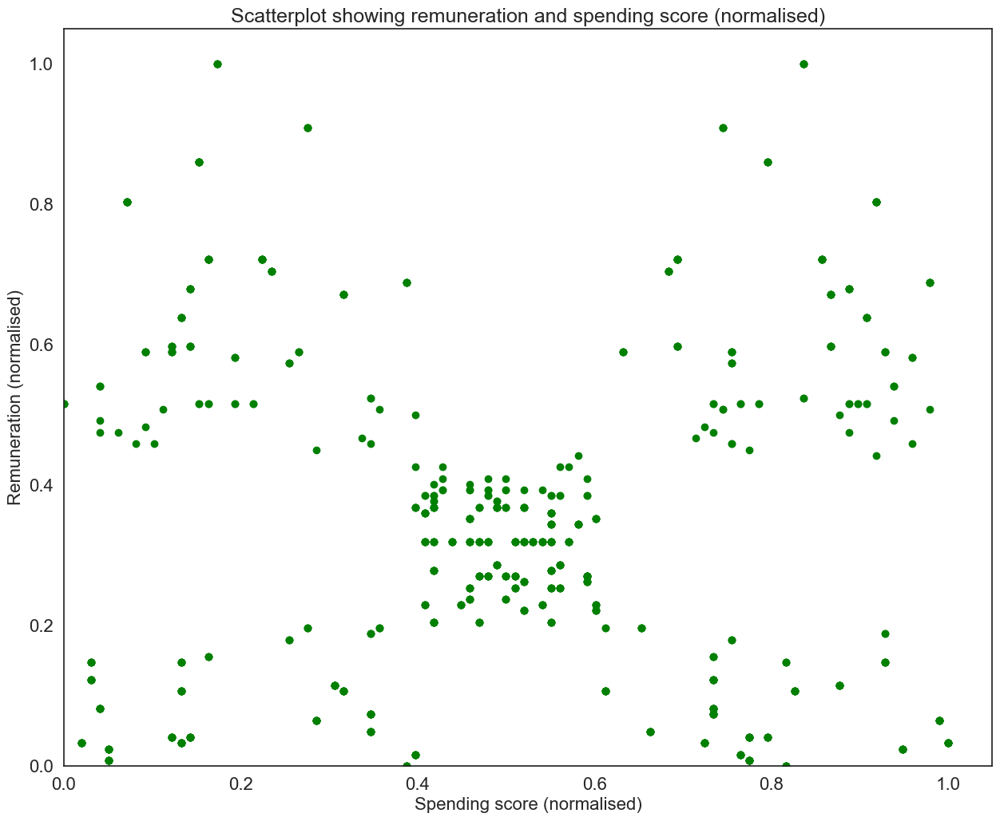

In [138]:
# Create a scatterplot with Seaborn.

scatterplot(x=x_norm,y=y_norm,y_pred=None,plotLine=False,colour="green",line_colour="",
            title="Scatterplot showing remuneration and spending score (normalised)",
            x_label="Spending score (normalised)",y_label="Remuneration (normalised)",
            save_filename="kmeans_scatter.png")


The scatterplot shows a clear and tight central cluster and four more diffuse clusters which are also clearly defined.  Further cluster analysis seems likely to be helpful, so we will apply k-means clustering first.

## 3. Elbow and silhoutte methods

In [141]:
!pip install threadpoolctl --upgrade

In [142]:
# Determine the number of clusters: Elbow method.

#The below line is purely to prevent a warning about memory leaks coming up "UserWarning: KMeans is known to have a memory leak on
#Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
#I added this variable and the warnings still happen...

warnings.filterwarnings("ignore")
inertias=[]

#Run the k-means algorithm against the data using values of k from 2-11
#Storing the inertia each time to enable us to find an optimal k via the elbow method
for i in range (2,12):
    kmeans=KMeans(n_clusters=i,init='k-means++',max_iter=500,n_init=10,random_state=42)

    #Fit to the dataset
    kmeans.fit(customers_cl)

    inertias.append(kmeans.inertia_)

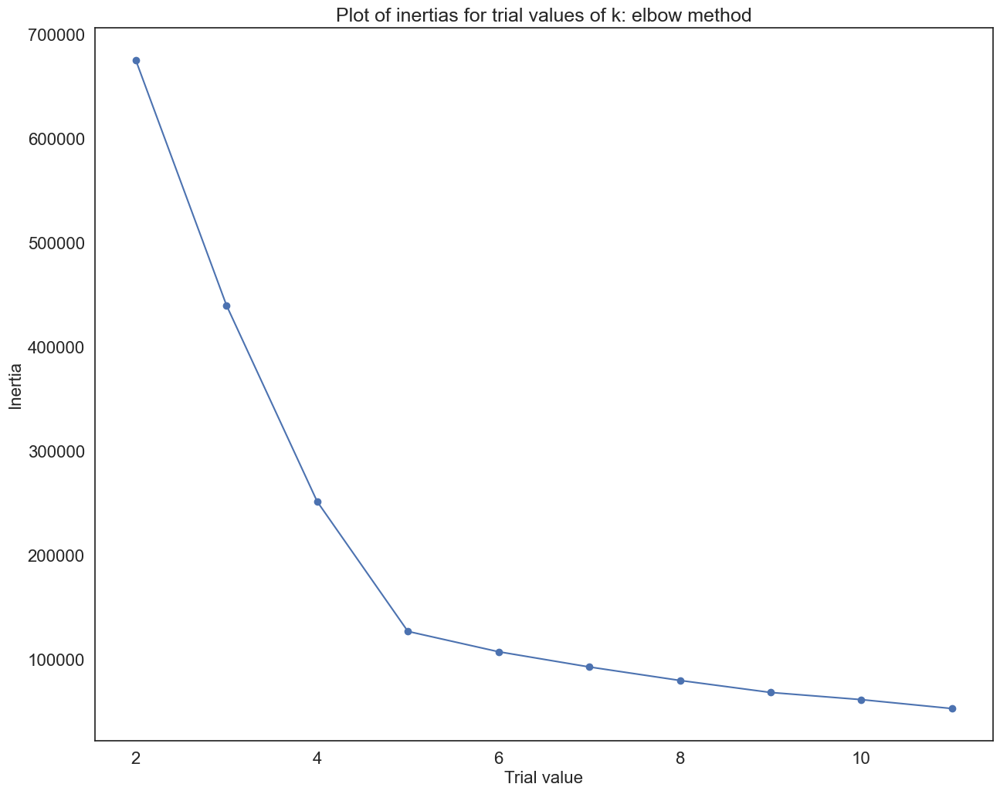

In [143]:
#Plot the inertia against the trial values of k so we can use the elbow method
lineplot(x=range(2,12),y=inertias,title="Plot of inertias for trial values of k: elbow method",x_label="Trial value",y_label="Inertia")

The elbow method shows a clear case for k=5 due to the marked change from large drops in inertia for k<5 to much smaller ones for k>5.  This 
matches the scatterplot which shows 5 clear clusters

### Evaluating optimal values of k via the silhouette method

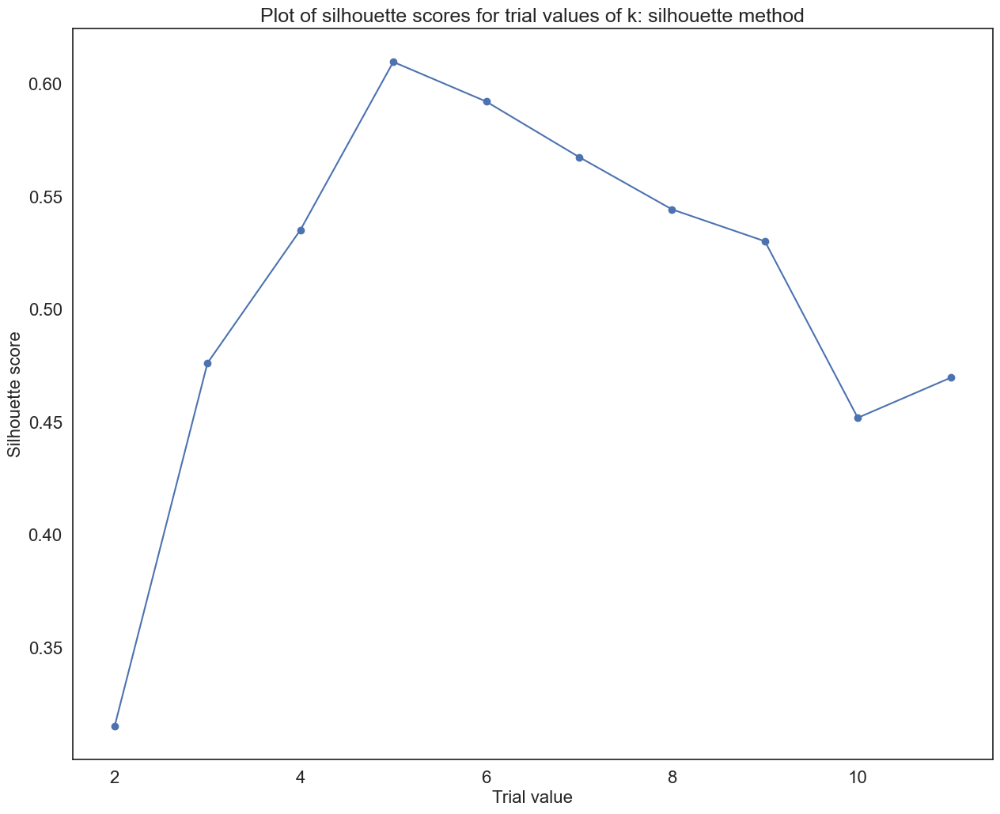

In [146]:
# Determine the number of clusters: Silhouette method.
sil=[]

#Loop around the trial values of k
for i in range(2,12):

    #Build k means model with trial value
    kmeans=KMeans(n_clusters=i,init='k-means++',max_iter=500,n_init=10,random_state=42)

    #Fit the model
    kmeans.fit(customers_cl)

    #Store the labels
    labels=kmeans.labels_

    #Add the silhouette score for this value of K to the list
    #The Silhouette Coefficient is calculated using the mean intra-cluster distance (a) and the mean nearest-cluster distance (b) 
    #for each sample. The Silhouette Coefficient for a sample is (b - a) / max(a, b). To clarify, b is the distance between a sample and the 
    #nearest cluster that the sample is not a part of. Note that Silhouette Coefficient is only defined if number of labels is
    #2 <= n_labels <= n_samples - 1.
    #See https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html
    
    sil.append(silhouette_score(customers_cl,labels,metric='euclidean'))

#Plot the silhouette scores
lineplot(x=range(2,12),y=sil,title="Plot of silhouette scores for trial values of k: silhouette method",x_label="Trial value",y_label="Silhouette score")

The highest silhouette score is achieved with k=5.  This matches the elbow method.  However exploration of values 4 and 6 could also be interesting.

## 4. Evaluate k-means model at different values of *k*

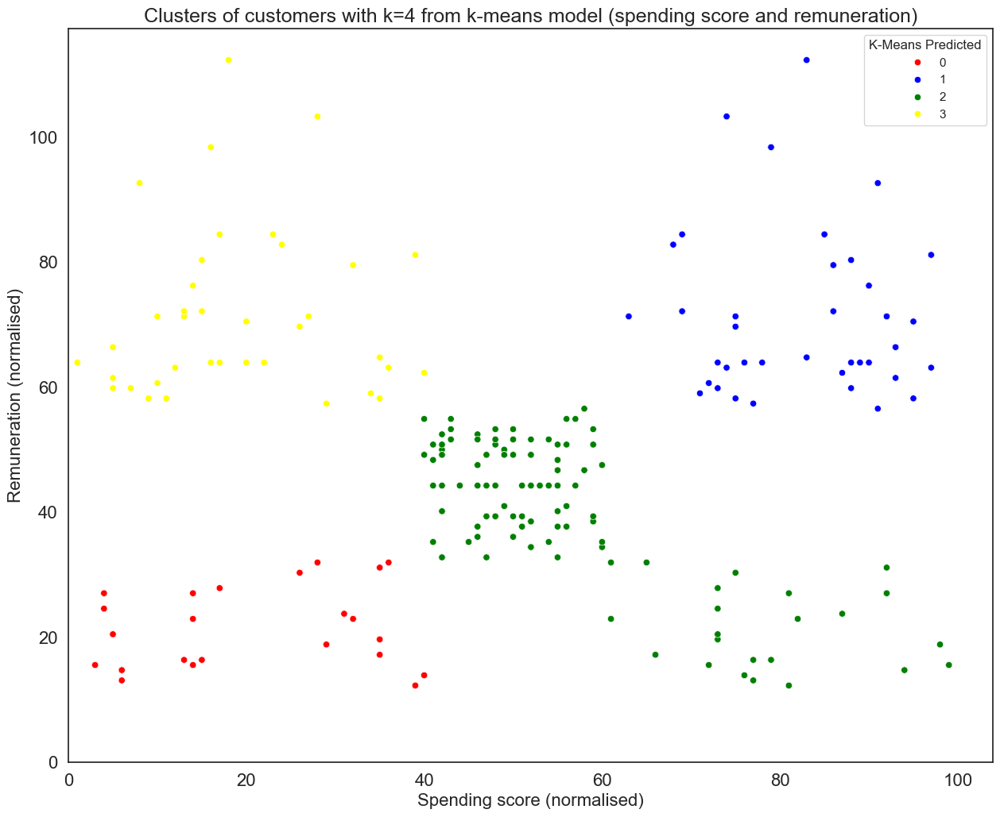

In [149]:
# Evaluation of k=4

#Feed in a greater number of iterations as w home in on our final k but keep other parameters the sa,e
kmeans=KMeans(n_clusters=4,max_iter=15000, init='k-means++',n_init=10,random_state=42)

#Fit the model
kmeans.fit(X)

#Get the labels and add them as a further field in the dataframe - this will label the clusters
clusters=kmeans.labels_
customers_cl['K-Means Predicted']=clusters

#Create a scatterplot with these clusters showing a legend
scatterplot(x=customers_cl['spending_score'],y=customers_cl['remuneration'],y_pred=None,plotLine=False,colour=None,line_colour="",
            title="Clusters of customers with k=4 from k-means model (spending score and remuneration)",
            x_label="Spending score (normalised)",y_label="Remuneration (normalised)",
            save_filename="kmeans_k4.png",hue='K-Means Predicted',df=customers_cl,seaborn_palette=["red","blue","green","yellow"])

K=4 creates some nicely defined clusters but the central and bottom right groupings have been combined despite being in some cases quite far apart in the feature space.  We will repeat the exercise with k=5.

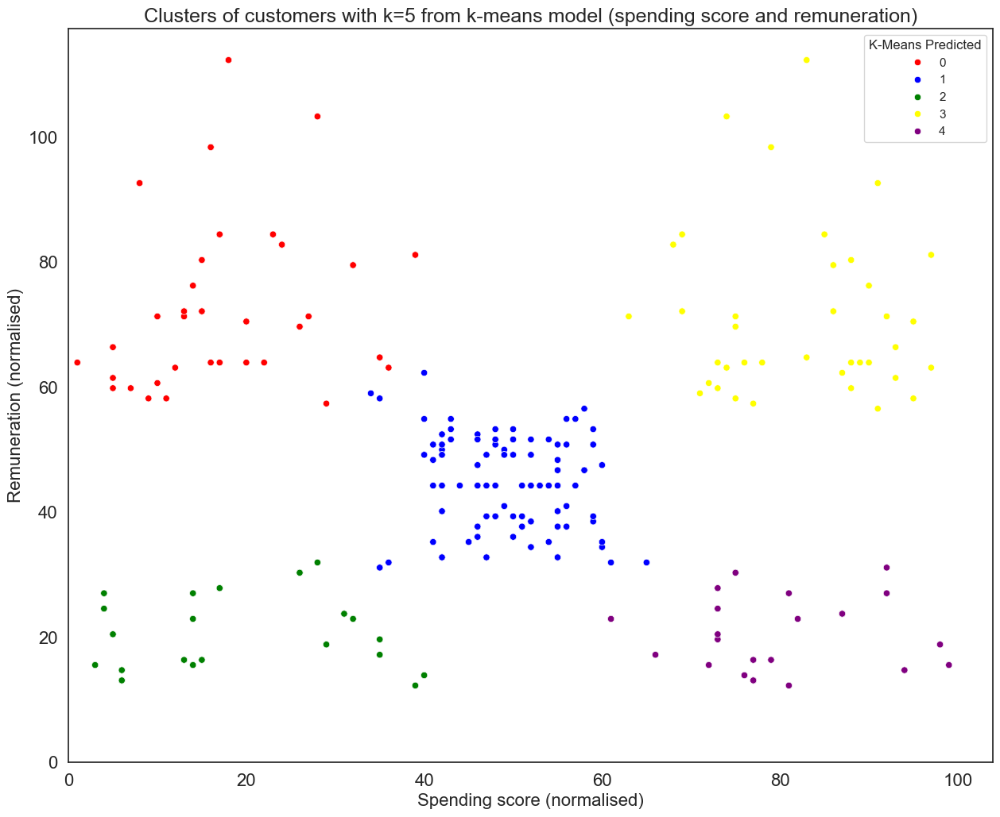

In [151]:
#k=5
kmeans=KMeans(n_clusters=5,max_iter=15000, init='k-means++',n_init=10,random_state=42)

#Fit the model
kmeans.fit(X)

#Get the labels and add them as a further field in the dataframe - this will label the clusters
clusters=kmeans.labels_
customers_cl['K-Means Predicted']=clusters

#Create a scatterplot with these clusters showing a legend
scatterplot(x=customers_cl['spending_score'],y=customers_cl['remuneration'],y_pred=None,plotLine=False,colour=None,line_colour="",
            title="Clusters of customers with k=5 from k-means model (spending score and remuneration)",
            x_label="Spending score (normalised)",y_label="Remuneration (normalised)",
            save_filename="kmeans_k5.png",hue='K-Means Predicted',df=customers_cl,
            seaborn_palette=["red","blue","green","yellow","purple"])

# k=5 seems to fit the visually intuitive clusters very well.  However for completeness we will examine k=6.

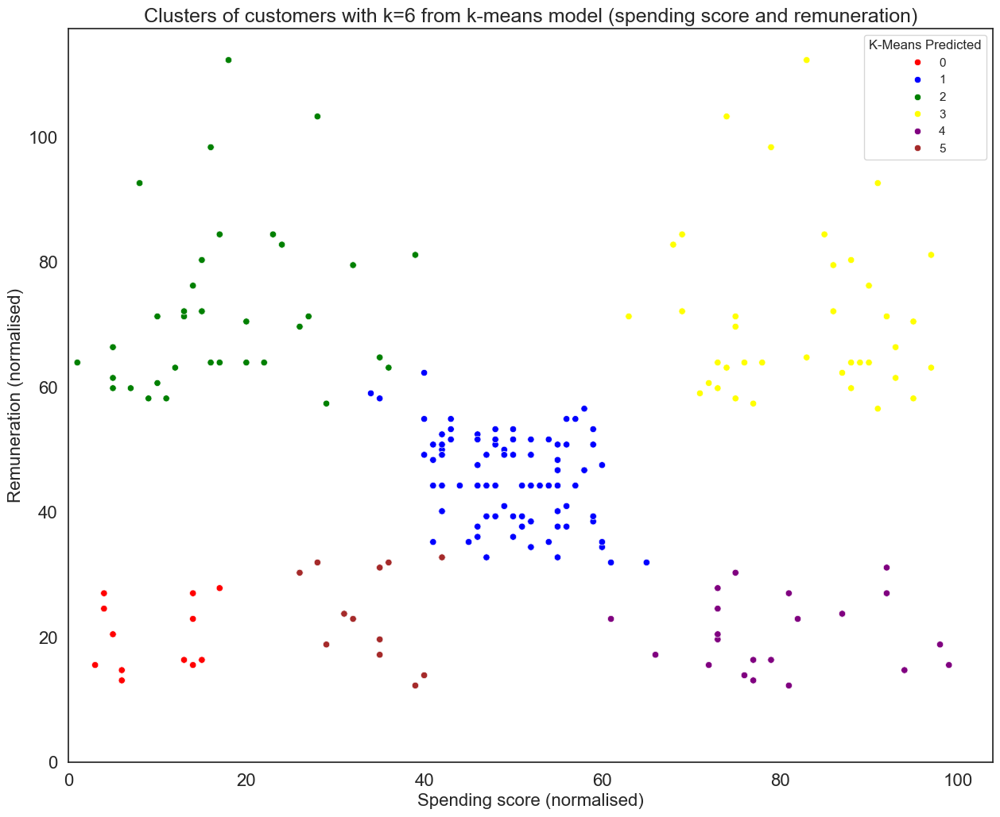

In [153]:
#k=6
kmeans=KMeans(n_clusters=6,max_iter=15000, init='k-means++',n_init=10,random_state=42)

#Fit the model
kmeans.fit(X)

#Get the labels and add them as a further field in the dataframe - this will label the clusters
clusters=kmeans.labels_
customers_cl['K-Means Predicted']=clusters

#Create a scatterplot with these clusters showing a legend
scatterplot(x=customers_cl['spending_score'],y=customers_cl['remuneration'],y_pred=None,plotLine=False,colour=None,line_colour="",
            title="Clusters of customers with k=6 from k-means model (spending score and remuneration)",
            x_label="Spending score (normalised)",y_label="Remuneration (normalised)",
            save_filename="kmeans_k6.png",hue='K-Means Predicted',df=customers_cl,
            seaborn_palette=["red","blue","green","yellow","purple","brown"])

The difference with k=6 is that the bottom left cluster is now broken into 2 smaller clusters.  This makes things somewhat uneven as the sizes 
are quite a lot smaller than the other clusters.  Also "low remuneration/low spending" and "low remuneration/slightly higher spending" as groups
in business terms do not seem to add much value.  For this reason, we will select k=5 as our final k.  However we will now try hierarachial clustering to see whether it also supports the same number of clusters.

The ward method seeks to minimise the sum of squared distance between data points in each cluster in a similar way to k-means but taking a hierarchical "bottom-up" approach.

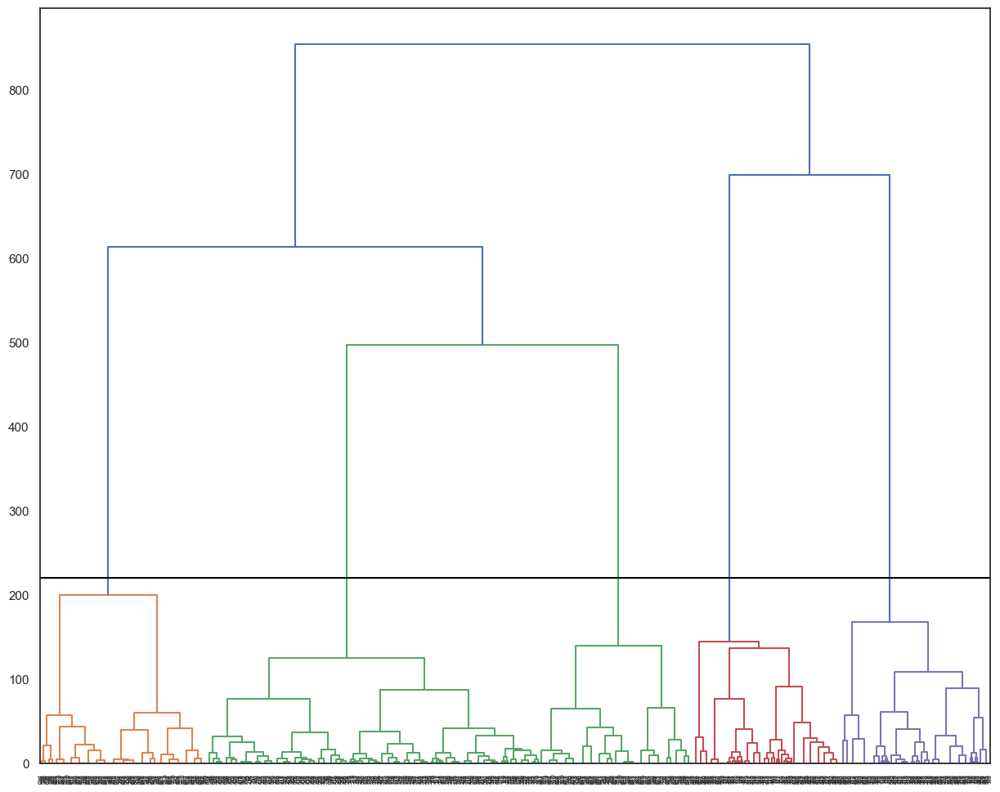

In [155]:
#Create a dendrogram using the ward linkage method
dendro = dendrogram(linkage(customers_cl[['spending_score','remuneration']], method = "ward"))

#Draw the dendrogram "split"
plt.axhline(y=220,color='black')
plt.savefig('dendro_ward.png')
plt.show()

Using a visual/intuitive approach we wish to "cut" the dendrogram as far down as possible while maintaining the maximum horizontal difference 
(and therefore "distinctness") between clusters.  The back line appears to be the optimal place to do this, and also gives us 5 clusters.

We will now try the average linkage method as a comparison as this is quite different from Ward as it seeks to minimise the average distance between points across each pair of clusters.

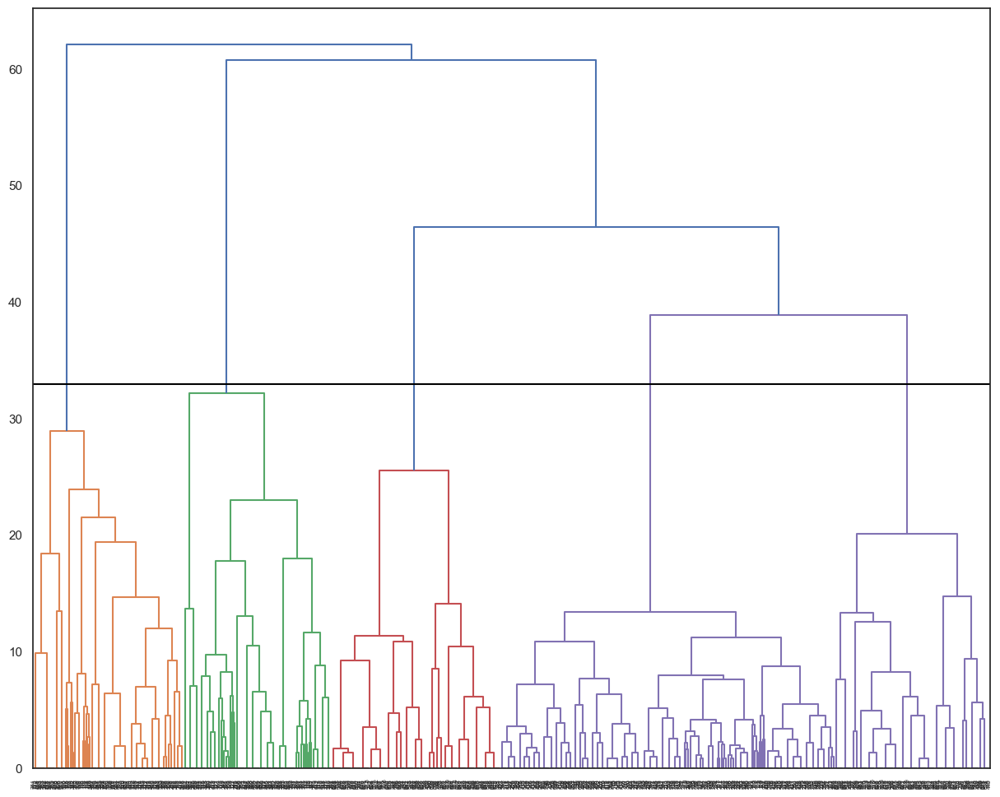

In [158]:
#Create a dendrogram using the ward linkage method
dendro = dendrogram(linkage(customers_cl[['spending_score','remuneration']], method = "average"))

#Draw the dendrogram "split"
plt.axhline(y=33,color='black')
plt.savefig('dendro_average.png')
plt.show()

## Fit final model 

In [160]:
kmeans=KMeans(n_clusters=5,max_iter=15000, init='k-means++',n_init=10,random_state=42)

#Fit the model
kmeans.fit(X)

#Get the labels and add them as a further field in the dataframe - this will label the clusters
clusters=kmeans.labels_
customers_cl['K-Means Predicted']=clusters

In [161]:
# Check the number of observations per predicted class.
customers_cl['K-Means Predicted'].value_counts()

K-Means Predicted
1    282
2    132
4    127
3    121
0    120
Name: count, dtype: int64

Cluster 1 is over twice the size of the others but the sizes are fairly even for the other clusters.

## 6. Plot and interpret the clusters

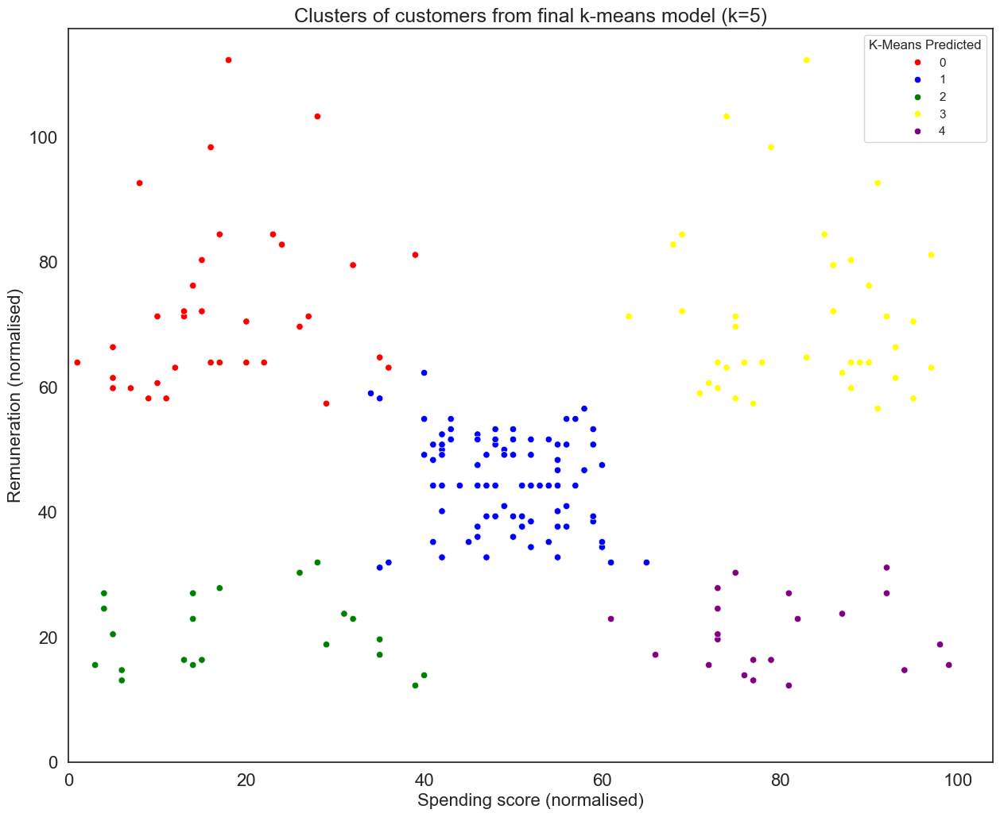

In [164]:
#Create a scatterplot with these clusters showing a legend
scatterplot(x=customers_cl['spending_score'],y=customers_cl['remuneration'],y_pred=None,plotLine=False,colour=None,line_colour="",
            title="Clusters of customers from final k-means model (k=5)",
            x_label="Spending score (normalised)",y_label="Remuneration (normalised)",
            hue='K-Means Predicted',df=customers_cl,
            seaborn_palette=["red","blue","green","yellow","purple"])

To explain the chart to the business, we need to describe the clusters in an appropriate way.

0 (red) low spending score/high remuneration - "affluent and careful"
1 (blue) moderate spending/moderate remuneration - "the middle"
2 (green) low spending/low remuneration - "low income and careful"
3 (yellow) high spending/high remuneration - "affluent and extravagant"
4 (purple) high spending/low income - "low income and extravagant"

We will re-label the legend appropriately

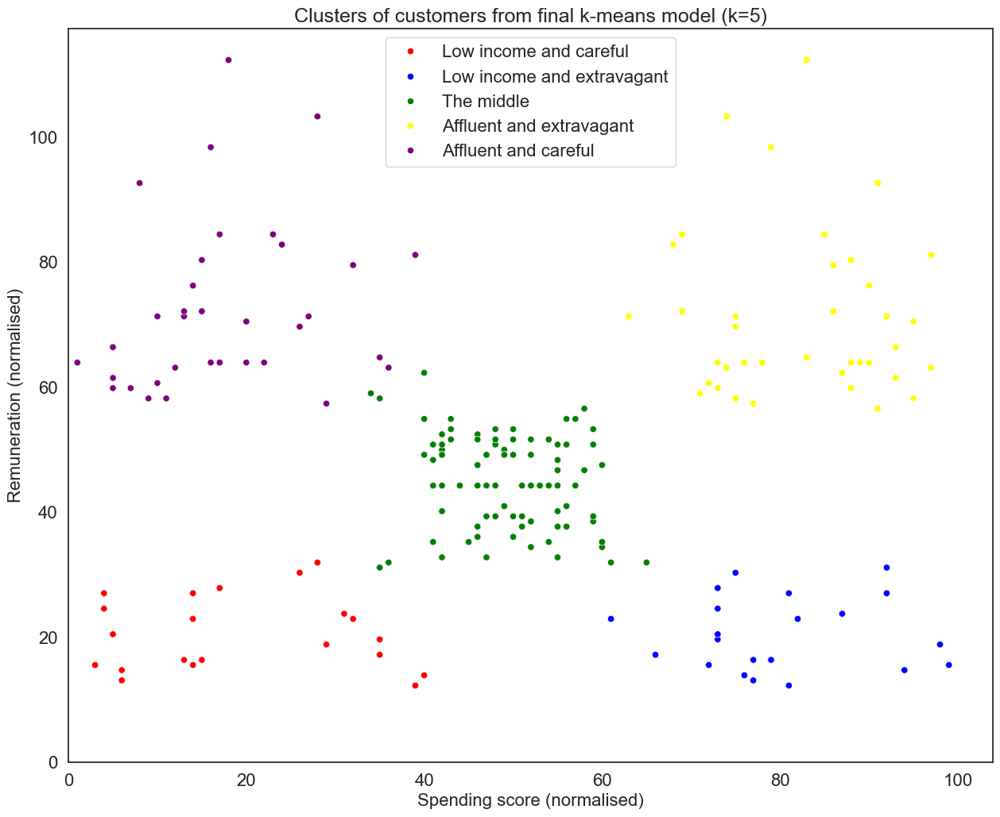

In [166]:
#Create a scatterplot with these clusters showing a legend
            
#Dictionary mapping cluster numbers to meaningful names

cl_names={0:"Affluent and careful",1:"The middle",2:"Low income and careful",3:"Affluent and extravagant",4:"Low income and extravagant"}

#Create new column with meaningful names, mapping using dictionary
customers_cl.loc[:,['cluster_name']]=customers_cl['K-Means Predicted'].map(cl_names)

#Plot the data again with the new labels
scatterplot(x=customers_cl['spending_score'],y=customers_cl['remuneration'],y_pred=None,plotLine=False,colour=None,line_colour="",
            title="Clusters of customers from final k-means model (k=5)",
            x_label="Spending score (normalised)",y_label="Remuneration (normalised)",
            hue='cluster_name',df=customers_cl,
            seaborn_palette=["red","blue","green","yellow","purple"],
            legend_pos="upper center",
            save_filename="kmeans_final.png")

## 7. Insights and observations

***There is a clear case for 5 clusters of customers demonstrated by both k-means and hierarchical clustering, giving us 5 "buyer personas"***

"affluent and careful"
"the middle"
"low income and careful"
"affluent and extravagant"
"low income and extravagant"

These can provide the basis of marketing strategies tailored to the differing priorities across the clusters.

In [168]:
#Re-enable default warnings filter so we don't miss anything important
warnings.filterwarnings("default")

# 

# NLP using Python

## 1. Prepare the reviews data for NLP

We will work with the full reviews dataset for this section as we need to apply NLP to the review text.

In [173]:
#Download required nltk components (1 time)
#nltk.download ('punkt')
#nltk.download ('stopwords')

#Build a dataframe containing the required columns only - leave product in so we can identify products with negative reviews
reviews_text=reviews_full[['review','summary','product']]

print(reviews_text.shape)
print(reviews_text.dtypes)

reviews_text.head()

(2000, 3)
review     object
summary    object
product     int64
dtype: object


,review,summary,product
0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...,453
1,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...,466
2,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless",254
3,Amazing buy! Bought it as a gift for our new d...,Five Stars,263
4,As my review of GF9's previous screens these w...,Money trap,291


In [174]:
#Make both fields lowercase
reviews_text.loc[:,'review'] = reviews_text.loc[:,'review'].apply(lambda x: " ".join(x.lower() for x in x.split()))
reviews_text.loc[:,'summary'] = reviews_text.loc[:,'summary'].apply(lambda x: " ".join(x.lower() for x in x.split()))

reviews_text.head()

,review,summary,product
0,"when it comes to a dm's screen, the space on t...",the fact that 50% of this space is wasted on a...,453
1,an open letter to galeforce9*: your unpainted ...,another worthless dungeon master's screen from...,466
2,"nice art, nice printing. why two panels are fi...","pretty, but also pretty useless",254
3,amazing buy! bought it as a gift for our new d...,five stars,263
4,as my review of gf9's previous screens these w...,money trap,291


In [175]:
#Do we have any duplicates?

reviews_text[reviews_text.duplicated()]

,review,summary,product
1006,great game,five stars,1183


It is not felt we can be confident these are genuine duplicates as "great game" is perhaps not an uncommon phrase to use.
We will leave this in.

In [177]:
# Determine if there are any missing values.

#Check for blanks

reviews_text.isna().sum()

review     0
summary    0
product    0
dtype: int64

In [178]:
#Check for nulls
reviews_text.isnull().sum()

review     0
summary    0
product    0
dtype: int64

No blanks or nulls found

In [180]:
#Remove punctuation using regular expressions

reviews_text.loc[:,"review"]=reviews_text.loc[:,"review"].str.replace(r'[^\w\s]','',regex=True)
reviews_text.loc[:,"summary"]=reviews_text.loc[:,"summary"].str.replace(r'[^\w\s]','',regex=True)

reviews_text.head()

,review,summary,product
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...,453
1,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...,466
2,nice art nice printing why two panels are fill...,pretty but also pretty useless,254
3,amazing buy bought it as a gift for our new dm...,five stars,263
4,as my review of gf9s previous screens these we...,money trap,291


## 2. Tokenise and create wordclouds

In [182]:
# Create new DataFrame (copy DataFrame).
rt_copy=reviews_text.copy()

# View DataFrame.

print(rt_copy.shape)

rt_copy.head()

(2000, 3)


,review,summary,product
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...,453
1,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...,466
2,nice art nice printing why two panels are fill...,pretty but also pretty useless,254
3,amazing buy bought it as a gift for our new dm...,five stars,263
4,as my review of gf9s previous screens these we...,money trap,291


In [183]:
# Apply word tokenisation to both columns.

rt_copy['summary_tokens'] = rt_copy['summary'].apply(word_tokenize)
rt_copy['review_tokens'] = rt_copy['review'].apply(word_tokenize)

# View DataFrame.

rt_copy.head()

,review,summary,product,summary_tokens,review_tokens
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...,453,"[the, fact, that, 50, of, this, space, is, was...","[when, it, comes, to, a, dms, screen, the, spa..."
1,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...,466,"[another, worthless, dungeon, masters, screen,...","[an, open, letter, to, galeforce9, your, unpai..."
2,nice art nice printing why two panels are fill...,pretty but also pretty useless,254,"[pretty, but, also, pretty, useless]","[nice, art, nice, printing, why, two, panels, ..."
3,amazing buy bought it as a gift for our new dm...,five stars,263,"[five, stars]","[amazing, buy, bought, it, as, a, gift, for, o..."
4,as my review of gf9s previous screens these we...,money trap,291,"[money, trap]","[as, my, review, of, gf9s, previous, screens, ..."


In [184]:
#Clean each field to prepare for further analysis

#Retrieve stopwords (1-time)
#nltk.download ('stopwords')

#Retrieve lemmatizer library (1-time)
#nltk.download('omw-1.4')

lemmatizer=WordNetLemmatizer()
#Get stopwords and English words
stop_words = set(stopwords.words('english'))
all_english_words = set(words.words())

#Function to remove stopwords, non-alphanumerics and non-English words from list, and lemmatize each result
def clean_word_list(word_list,stop_words,all_english_words,lemmatizer):
    return [lemmatizer.lemmatize(word) for word in word_list if word not in stop_words and word.isalpha() and word in all_english_words]

#Lemmatize, remove stopwords and non-alpha/non-English words
rt_copy["review_tokens_clean"]=rt_copy['review_tokens'].apply(clean_word_list,args=(stop_words,all_english_words,lemmatizer))
rt_copy["summary_tokens_clean"]=rt_copy['summary_tokens'].apply(clean_word_list,args=(stop_words,all_english_words,lemmatizer))

rt_copy.head()

,review,summary,product,summary_tokens,review_tokens,review_tokens_clean,summary_tokens_clean
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...,453,"[the, fact, that, 50, of, this, space, is, was...","[when, it, comes, to, a, dms, screen, the, spa...","[come, screen, space, screen, absolute, premiu...","[fact, space, wasted, art, terribly, informati..."
1,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...,466,"[another, worthless, dungeon, masters, screen,...","[an, open, letter, to, galeforce9, your, unpai...","[open, letter, unpainted, bad, spell, great, b...","[another, worthless, dungeon, screen]"
2,nice art nice printing why two panels are fill...,pretty but also pretty useless,254,"[pretty, but, also, pretty, useless]","[nice, art, nice, printing, why, two, panels, ...","[nice, art, nice, printing, two, filled, gener...","[pretty, also, pretty, useless]"
3,amazing buy bought it as a gift for our new dm...,five stars,263,"[five, stars]","[amazing, buy, bought, it, as, a, gift, for, o...","[amazing, buy, bought, gift, new, perfect]",[five]
4,as my review of gf9s previous screens these we...,money trap,291,"[money, trap]","[as, my, review, of, gf9s, previous, screens, ...","[review, previous, completely, unnecessary, ne...","[money, trap]"


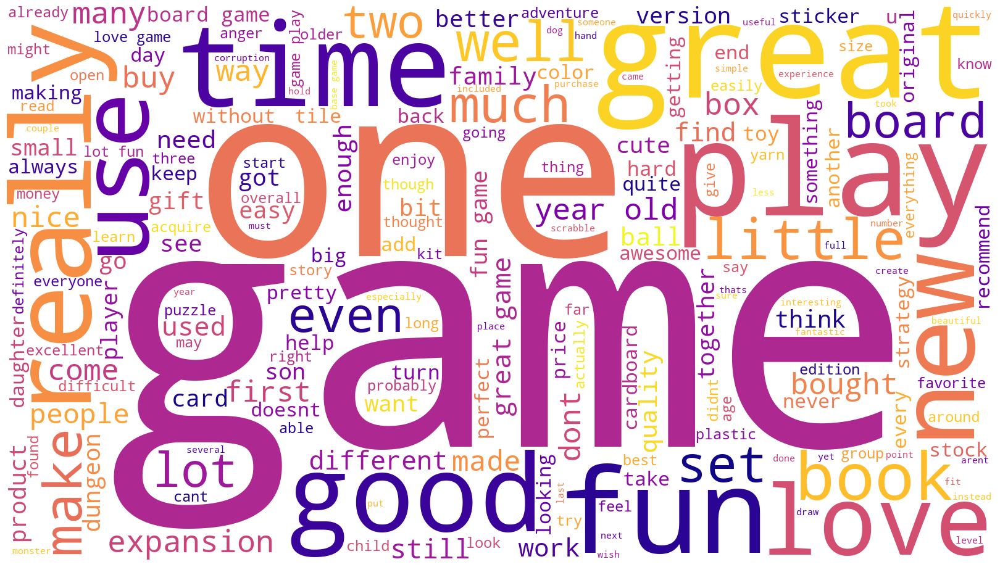

In [185]:
# Review: Plot the WordCloud image.

all_review_tokens=""
#Build a single variable of all the review tokens

for i in range(1,rt_copy.shape[0]):
    all_review_tokens=all_review_tokens + " " + " ".join(rt_copy["review_tokens_clean"][i])

# Create a WordCloud.
wordcloud = WordCloud(width = 1600, height = 900, 
                background_color ='white', 
                colormap='plasma', 
                min_font_size = 10).generate(all_review_tokens) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis('off') 
plt.tight_layout(pad = 0) 
plt.savefig("review_wordcloud.png",dpi=800)
plt.show()


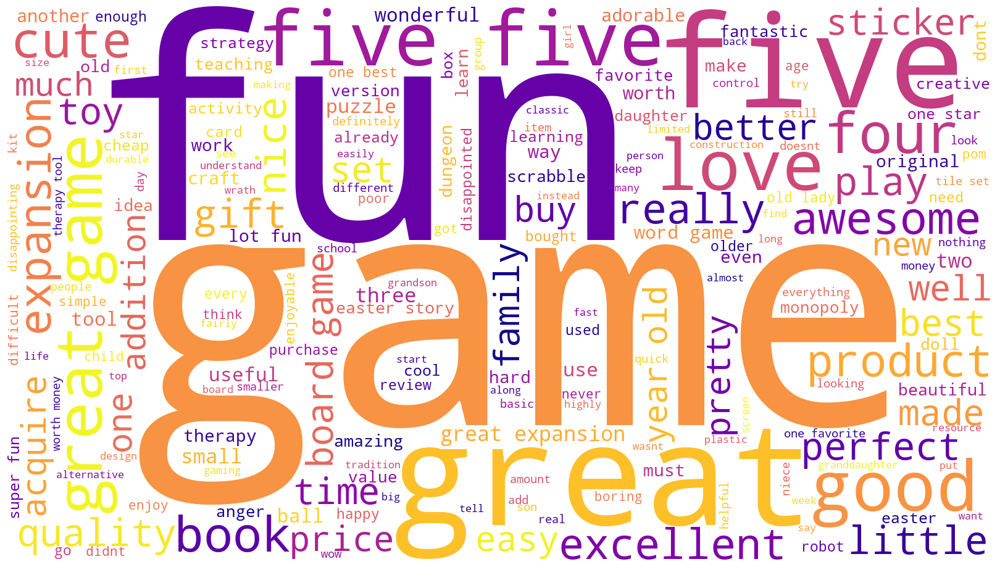

In [186]:
# Summary: Plot the WordCloud image.

all_summary_tokens=""

#Build a single variable of all the summary tokens

for i in range(1,rt_copy.shape[0]):
    all_summary_tokens=all_summary_tokens + " " + " ".join(rt_copy["summary_tokens_clean"][i])

# Create a WordCloud.
wordcloud = WordCloud(width = 1600, height = 900, 
                background_color ='white', 
                colormap='plasma', 
                min_font_size = 10).generate(all_summary_tokens) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis('off') 
plt.tight_layout(pad = 0) 
plt.savefig("summary_wordcloud.png",dpi=800)
plt.show()


## 4. Frequency distribution and polarity
### 4a) Create frequency distribution for reviews and summary data and select the most common 15 words from each

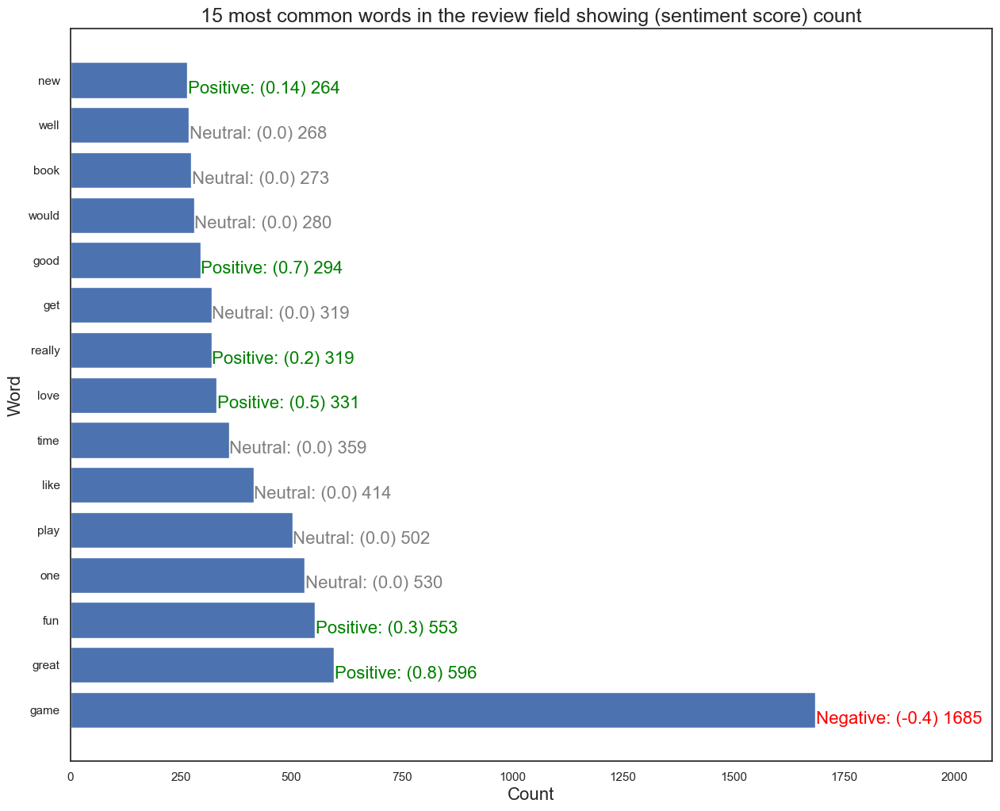

In [188]:
# Visualise the most common 15 words in the reviews and summary fields

#Function to generate polarity for text
def generate_polarity(text):
    return TextBlob(text).sentiment[0]

#Define function to build frequenct distribution an plot on barchart
#df=dataframe containing our data
#tokenFieldName=column name of the field with the list of tokens
#title=title for the bar chart
#mostCommonCount=how many of the most common words to plot

def wordListBarChart(df,tokenFieldName,title,mostCommonCount):

    all_tokens=[]

    for i in range(1,df.shape[0]):
        all_tokens=all_tokens + df[tokenFieldName][i]


    counts=pd.DataFrame(Counter(all_tokens).most_common(mostCommonCount),
                      columns=['Word', 'Frequency'])

    #Add the polarity score for each word
    counts["Sentiment_score"]=counts["Word"].apply(generate_polarity)

    # Set the plot type.

    fig, ax = plt.subplots()
    
    ax.barh(counts["Word"],counts["Frequency"])
    
    # Set the labels.
    ax.set_xlabel('Count', fontsize=axis_label_fontsize)
    ax.set_ylabel('Word', fontsize=axis_label_fontsize)
    ax.set_title(title,fontsize=title_fontsize)

    #Add some contingency so we dont cut off the labels..
    ax.set_xlim(0,np.max(counts["Frequency"]) + 400)
    barCounter=0
    
    # Draw the bar labels.
    for i in ax.patches:
    
        #Build bar label text and color based on sentiment score
        label=""
        color="green"
        
        if counts["Sentiment_score"][barCounter]>0:
            label="Positive: " + f"({round(counts["Sentiment_score"][barCounter],2)})"
        elif counts["Sentiment_score"][barCounter]==0:
            label="Neutral: " + f"({round(counts["Sentiment_score"][barCounter],2)})"
            color="grey"
        else:
            label="Negative: " + f"({round(counts["Sentiment_score"][barCounter],2)})"
            color="red"

        #Add the frequency
        label=label + " " + str(round((i.get_width()), 2))
            
        ax.text(i.get_width()+ 1, i.get_y()+.1,label,fontsize=axis_label_fontsize, color=color)

        barCounter=barCounter + 1

    plt.savefig(f"{tokenFieldName}_word_freq_bar.png",dpi=800,bbox_inches='tight')
    plt.show()
    
    #return the counts for later use
    return counts

#Call function for review field
review_counts=wordListBarChart(rt_copy,"review_tokens_clean","15 most common words in the review field showing (sentiment score) count",15)

The 15 most common words in the review text and mostly positive or neutral.  Although game is marked as having a negative sentiment, this is perhaps incorrect as it is likely that the word is mainly used as a noun e.g "snakes and ladders is a good game" rather than a verb e.g "game the system" etc which may have negative connotations.

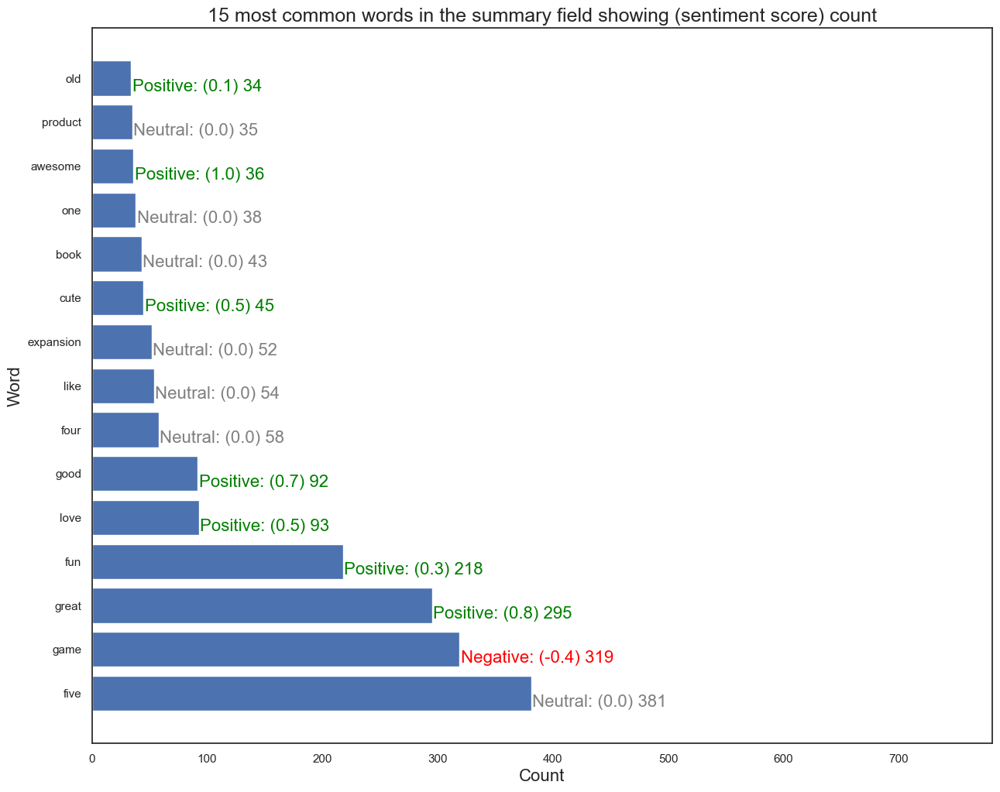

In [190]:
#Call function for summary field
summary_counts=wordListBarChart(rt_copy,"summary_tokens_clean","15 most common words in the summary field showing (sentiment score) count",15)

The 15 most common words in the summary text are mostly positive or neutral although game is marked as having a negative sentiment, possibly incorrectly so.

## 5. Get the review and summary polarity scores and visualise.

In [193]:
# Determine polarity of both columns. 

#Function to create single string from list wordList and return polarity of joined string
def joinTokensAndGetPolarity(wordList):
    joinedValue=" ".join(wordList)
    polarityScore=TextBlob(joinedValue).sentiment[0]

    return polarityScore;

def joinTokensAndGetSubjectivity(wordList):
    joinedValue=" ".join(wordList)
    subjectivityScore=TextBlob(joinedValue).sentiment[1]

    return subjectivityScore;

#Get the sentiment polarity for both fields
rt_copy["review_sentiment"]=rt_copy["review_tokens_clean"].apply(joinTokensAndGetPolarity)
rt_copy["summary_sentiment"]=rt_copy["summary_tokens_clean"].apply(joinTokensAndGetPolarity)

#Get the sentiment subjectivity for both fields
rt_copy["review_subjectivity"]=rt_copy["review_tokens_clean"].apply(joinTokensAndGetSubjectivity)
rt_copy["summary_subjectivity"]=rt_copy["summary_tokens_clean"].apply(joinTokensAndGetSubjectivity)


rt_copy.head()

,review,summary,product,summary_tokens,review_tokens,review_tokens_clean,summary_tokens_clean,review_sentiment,summary_sentiment,review_subjectivity,summary_subjectivity
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...,453,"[the, fact, that, 50, of, this, space, is, was...","[when, it, comes, to, a, dms, screen, the, spa...","[come, screen, space, screen, absolute, premiu...","[fact, space, wasted, art, terribly, informati...",-0.242857,-0.6,0.428571,0.500000
1,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...,466,"[another, worthless, dungeon, masters, screen,...","[an, open, letter, to, galeforce9, your, unpai...","[open, letter, unpainted, bad, spell, great, b...","[another, worthless, dungeon, screen]",-0.019468,-0.8,0.438796,0.900000
2,nice art nice printing why two panels are fill...,pretty but also pretty useless,254,"[pretty, but, also, pretty, useless]","[nice, art, nice, printing, why, two, panels, ...","[nice, art, nice, printing, two, filled, gener...","[pretty, also, pretty, useless]",0.118243,0.0,0.417217,0.733333
3,amazing buy bought it as a gift for our new dm...,five stars,263,"[five, stars]","[amazing, buy, bought, it, as, a, gift, for, o...","[amazing, buy, bought, gift, new, perfect]",[five],0.578788,0.0,0.784848,0.000000
4,as my review of gf9s previous screens these we...,money trap,291,"[money, trap]","[as, my, review, of, gf9s, previous, screens, ...","[review, previous, completely, unnecessary, ne...","[money, trap]",-0.316667,0.0,0.316667,0.000000


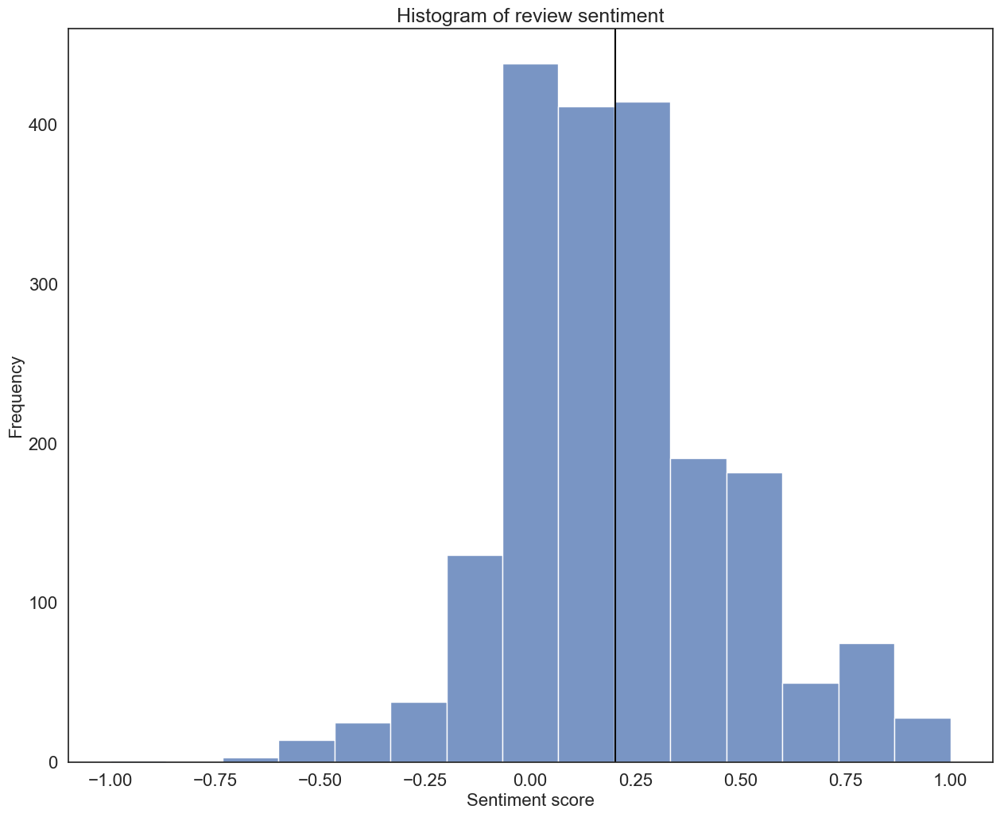

Mean review polarity: 0.20274336299317924


In [194]:
# Review: Create a histogram plot with bins = 15.
# Histogram of polarity, plotting a black line to show the mean

hist_mean=np.mean(rt_copy["review_sentiment"])
histplot(data=rt_copy,x="review_sentiment",bins=15,title="Histogram of review sentiment",x_label="Sentiment score",
         y_label="Frequency",mean=hist_mean,save_filename="review_sentiment_hist.png")

print(f"Mean review polarity: {hist_mean}")

Review sentiment is slightly left-skewed i.e toward a positive sentiment score

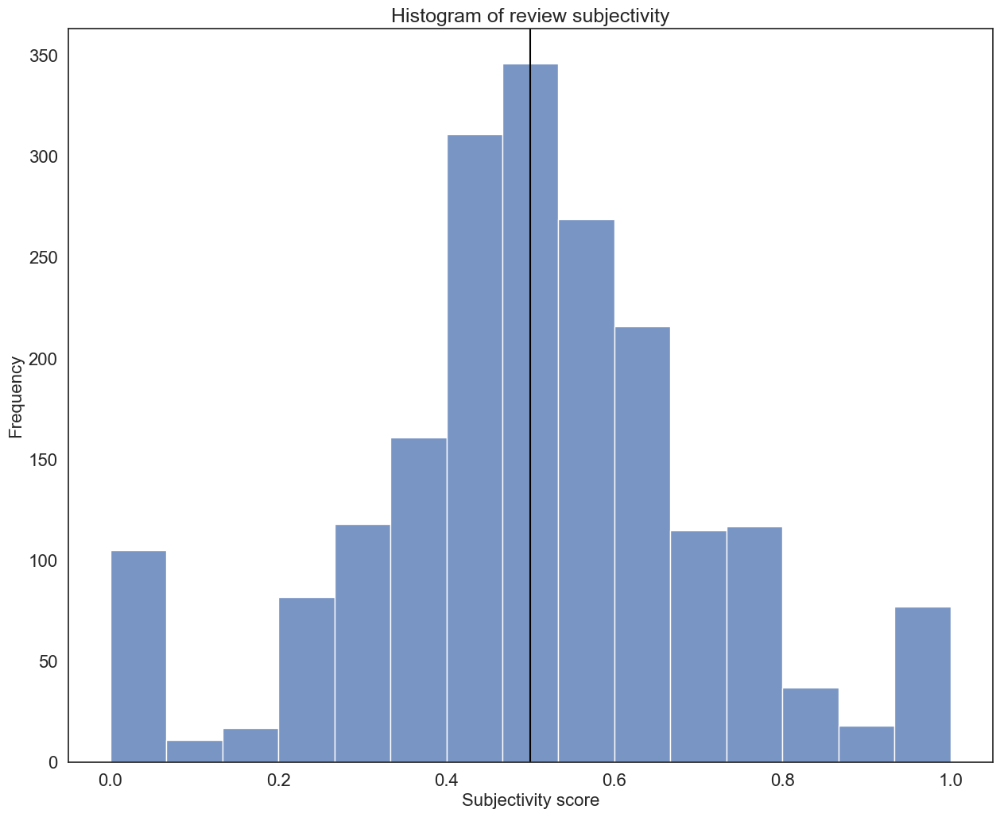

Mean review subjectivity: 0.499511164270141


In [196]:
# Histogram of review subjectivity, plotting the mean with a black line

hist_mean=np.mean(rt_copy["review_subjectivity"])

histplot(data=rt_copy,x="review_subjectivity",bins=15,title="Histogram of review subjectivity",x_label="Subjectivity score",
         y_label="Frequency",mean=hist_mean,save_filename="review_subjecty_hist.png")

print(f"Mean review subjectivity: {hist_mean}")

The review subjectivity is very slightly right-skewed but the effect is minimal.

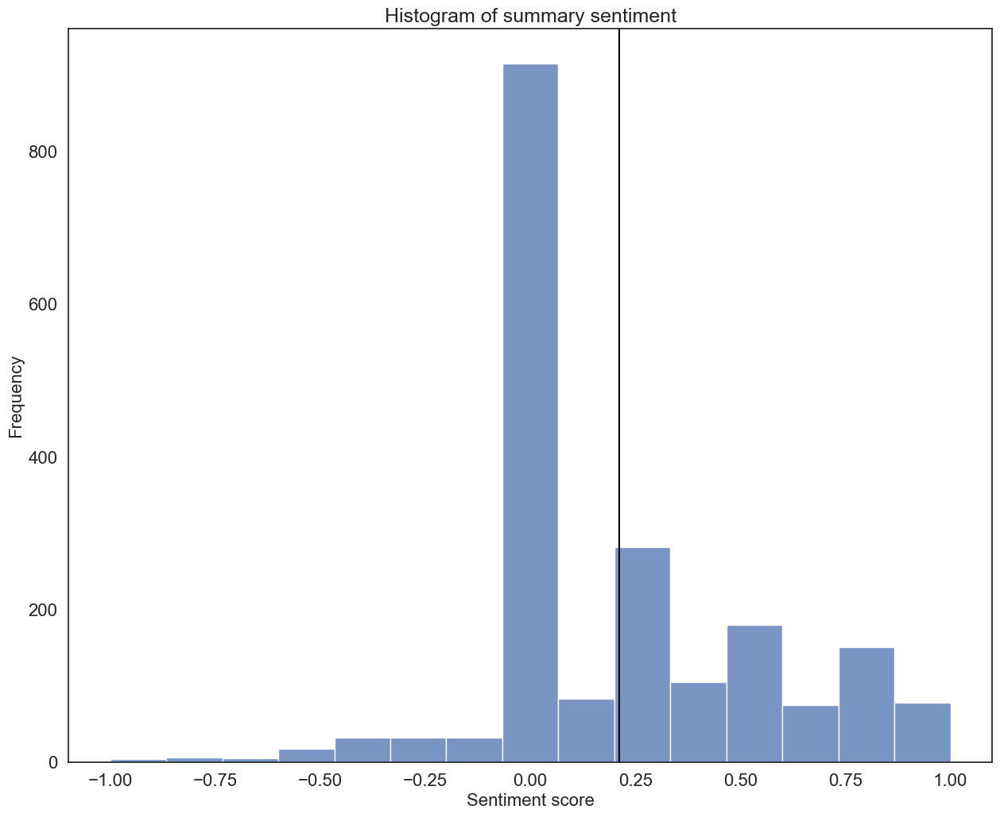

Mean summary polarity: 0.2112478345959596


In [198]:
#Histogram of summary polarity, showing the mean as a black line

hist_mean=np.mean(rt_copy["summary_sentiment"])
histplot(data=rt_copy,x="summary_sentiment",bins=15,title="Histogram of summary sentiment",x_label="Sentiment score",
         y_label="Frequency",mean=hist_mean,save_filename="summary_sentiment_hist.png")

print(f"Mean summary polarity: {hist_mean}")


Again the mean summary polarity is slightly positive.The data is right-skewed.

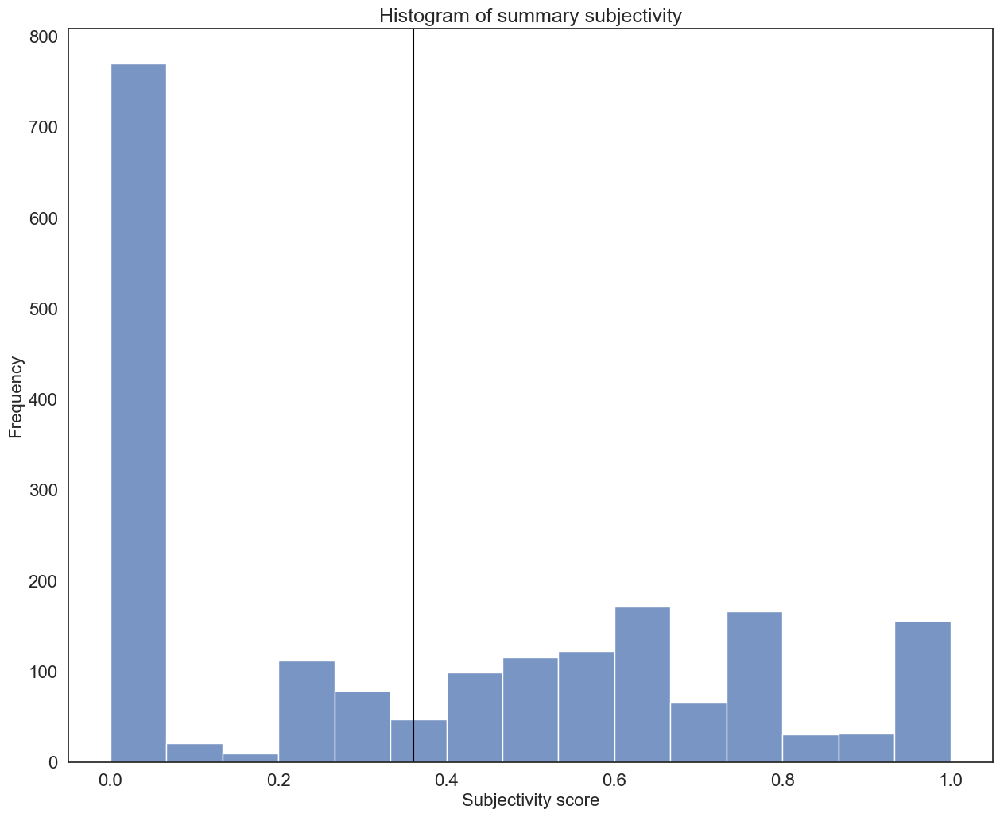

Mean summary subjectivity: 0.3607890824915825


In [200]:
#Finally, create a histogram for the summary subjectivity showing the mean as a line
hist_mean=np.mean(rt_copy["summary_subjectivity"])

histplot(data=rt_copy,x="summary_subjectivity",bins=15,title="Histogram of summary subjectivity",x_label="Subjectivity score",
         y_label="Frequency",mean=hist_mean,save_filename="summary_subjectivity_hist.png")

print(f"Mean summary subjectivity: {hist_mean}")

The mean summary subjectivity has a more factual than opinionated tone, although there is a long "tail" of higher scores

In [202]:
# Top 20 negative customers.

negative_reviews=rt_copy.nsmallest(20,"review_sentiment")

#Display maximum column width
pd.set_option('display.max_colwidth', None)

# View output.
negative_reviews[["review","review_sentiment"]]

,review,review_sentiment
208,booo unles you are patient know how to measure i didnt have the patience neither did my daughter boring unless you are a craft person which i am not,-1.000000
526,keeps clients engaged while helping them develop anger management skills the only criticism is i wish more of the cards had questions,-0.700000
174,i sent this product to my granddaughter the pompom maker comes in two parts and is supposed to snap together to create the pompoms however both parts were the same making it unusable if you cant make the pompoms the kit is useless since this was sent as a gift i do not have it to return very disappointed,-0.625000
1429,provides a lot more variety to the base game just wish i had a larger table now,-0.600000
182,incomplete kit very disappointing,-0.600000
538,i purchased this on the recommendation of two therapists working with my adopted children the children found it boring and put it down half way through,-0.583333
1804,im sorry i just find this product to be boring and to be frank juvenile,-0.583333
364,one of my staff will be using this game soon so i dont know how well it works as yet but after looking at the cards i believe it will be helpful in getting a conversation started regarding anger and what to do to control it,-0.550000
117,i bought this as a christmas gift for my grandson its a sticker book so how can i go wrong with this gift,-0.500000
173,horrible nothing more to say would give zero stars if possible,-0.500000


In [203]:
# Top 20 negative summaries.

negative_summaries=rt_copy.nsmallest(20,"summary_sentiment")

# View output.
negative_summaries[["summary","summary_sentiment"]]

,summary,summary_sentiment
21,the worst value ive ever seen,-1.000
173,horrible nothing more to say would give zero stars,-1.000
208,boring unless you are a craft person which i am,-1.000
829,boring,-1.000
1,another worthless dungeon masters screen from galeforce9,-0.800
1799,annoyingly addictive,-0.800
144,disappointed,-0.750
631,disappointed,-0.750
793,disappointed,-0.750
1620,disappointed,-0.750


In [204]:
# Top 20 positive reviews
positive_reviews=rt_copy.nlargest(20,"review_sentiment")

# View output.
positive_reviews[["review","review_sentiment"]]

,review,review_sentiment
7,came in perfect condition,1.0
165,awesome book,1.0
194,awesome gift,1.0
496,excellent activity for teaching selfmanagement skills,1.0
524,perfect just what i ordered,1.0
591,wonderful product,1.0
609,delightful product,1.0
621,wonderful for my grandson to learn the resurrection story,1.0
790,perfect,1.0
933,awesome,1.0


In [205]:
#Top 20 positive summaries
positive_summaries=rt_copy.nlargest(20,"summary_sentiment")

# View output.
positive_summaries[["summary","summary_sentiment"]]

,summary,summary_sentiment
6,best gm screen ever,1.0
28,wonderful designs,1.0
32,perfect,1.0
58,only ok at best,1.0
80,theyre the perfect size to keep in the car or a diaper,1.0
134,perfect for preschooler,1.0
140,awesome sticker activity for the price,1.0
161,awesome book,1.0
187,awesome,1.0
210,awesome and welldesigned for 9 year olds,1.0


As an alternative perspective we will now produce a document term matrix for each review using a simple "bag of words" model i.e not attempting to cater for multi-word groupings, bigrams/trigrams etc.

In [207]:
from sklearn.feature_extraction.text import CountVectorizer
#Build a list of each review

reviews_all=[]

#Build a list containing the concatenated cleaned tokens for each review
for i in range (1,rt_copy.shape[0]):
    reviews_all.append(" ".join(rt_copy["review_tokens_clean"][i]))

# Create a CountVectorizer object to process the reviews.
#We do not need to specify lowercase or stopwords etc or supply a tokenizer as we already pre-processed the data
cv = CountVectorizer()

# Apply the transformation to the reviews
cvs= cv.fit_transform(reviews_all)

# Create a DataFrame.
dt = pd.DataFrame(cvs.todense())

# Name the columns.
dt.columns = cv.get_feature_names_out()

# Transpose columns and headings.
document_term_matrix = dt.T

# Update the column names....each review is a document so we will have a lot of columns
#but it is really the word distribution we are interested in (1 row per word)
document_term_matrix.columns = ['Doc '+str(i) for i in range(1, rt_copy.shape[0])]

# Get the totals.
document_term_matrix['total_count'] = document_term_matrix.sum(axis=1)

# Identify the top 10 words. 
document_term_matrix = document_term_matrix.sort_values(by ='total_count', 
                                                        ascending=False)[:10] 

# Display the results (count only as we dont want to display the many columns....)
document_term_matrix["total_count"]

game      1685
great      596
fun        553
one        530
play       502
like       414
time       359
love       331
really     319
get        319
Name: total_count, dtype: int64

This has given us some slightly different words such as "really" and "get", although this is not hugely insightful.  Instead, we will repeat the DTM analysis using bigrams and trigrams only.

In [209]:
# Create a CountVectorizer object to process the reviews.
#Specify bigrams and trigrams ONLY
cv = CountVectorizer(ngram_range=(2, 3))

# Apply the transformation to the reviews
cvs= cv.fit_transform(reviews_all)

# Create a DataFrame.
dt = pd.DataFrame(cvs.todense())

# Name the columns.
dt.columns = cv.get_feature_names_out()

# Transpose columns and headings.
document_term_matrix = dt.T

# Update the column names....each review is a document so we will have a lot of columns
#but it is really the word distribution we are interested in (1 row per word)
document_term_matrix.columns = ['Doc '+str(i) for i in range(1, rt_copy.shape[0])]

# Get the totals.
document_term_matrix['total_count'] = document_term_matrix.sum(axis=1)

# Identify the top 10 words. 
document_term_matrix = document_term_matrix.sort_values(by ='total_count', 
                                                        ascending=False)[:10] 

# Display the results (count only as we dont want to display the many columns....)
document_term_matrix["total_count"]

year old      146
great game    116
fun game       83
board game     81
love game      62
game play      60
lot fun        55
base game      47
much fun       38
game fun       33
Name: total_count, dtype: int64

This is perhaps a little more valuable as it gives us some context into most common used short word "groups" which are all bigrams

Finally, apply a simple grouping so we can compare counts of review sentiments.

In [212]:
def sentimentText(score):
    if score<0:
        return "Negative"
    elif score>0:
        return "Positive"
    else:
        return "Neutral"

rt_copy["sentiment_desc"]=rt_copy["review_sentiment"].apply(sentimentText)

rt_copy.head()

,review,summary,product,summary_tokens,review_tokens,review_tokens_clean,summary_tokens_clean,review_sentiment,summary_sentiment,review_subjectivity,summary_subjectivity,sentiment_desc
0,when it comes to a dms screen the space on the screen itself is at an absolute premium the fact that 50 of this space is wasted on art and not terribly informative or needed art as well makes it completely useless the only reason that i gave it 2 stars and not 1 was that technically speaking it can at least still stand up to block your notes and dice rolls other than that it drops the ball completely,the fact that 50 of this space is wasted on art and not terribly informative or needed art,453,"[the, fact, that, 50, of, this, space, is, wasted, on, art, and, not, terribly, informative, or, needed, art]","[when, it, comes, to, a, dms, screen, the, space, on, the, screen, itself, is, at, an, absolute, premium, the, fact, that, 50, of, this, space, is, wasted, on, art, and, not, terribly, informative, or, needed, art, as, well, makes, it, completely, useless, the, only, reason, that, i, gave, it, 2, stars, and, not, 1, was, that, technically, speaking, it, can, at, least, still, stand, up, to, block, your, notes, and, dice, rolls, other, than, that, it, drops, the, ball, completely]","[come, screen, space, screen, absolute, premium, fact, space, wasted, art, terribly, informative, art, well, completely, useless, reason, gave, technically, speaking, least, still, stand, block, dice, ball, completely]","[fact, space, wasted, art, terribly, informative, art]",-0.242857,-0.6,0.428571,0.500000,Negative
1,an open letter to galeforce9 your unpainted miniatures are very not bad your spell cards are great your board games are meh your dm screens however are freaking terrible im still waiting for a single screen that isnt polluted with pointless artwork where useful referenceable tables should be once again youve created a single use screen that is only useful when running the storm kings thunder adventure even despite the fact that its geared to that adventure path its usefulness negligible at best i massive swath of the inner panel is wasted on artwork and a bloated overland map which could have been easily reduced to a single panel in size and the few table you have are nighuseless themselves in short stop making crap dm screens,another worthless dungeon masters screen from galeforce9,466,"[another, worthless, dungeon, masters, screen, from, galeforce9]","[an, open, letter, to, galeforce9, your, unpainted, miniatures, are, very, not, bad, your, spell, cards, are, great, your, board, games, are, meh, your, dm, screens, however, are, freaking, terrible, im, still, waiting, for, a, single, screen, that, isnt, polluted, with, pointless, artwork, where, useful, referenceable, tables, should, be, once, again, youve, created, a, single, use, screen, that, is, only, useful, when, running, the, storm, kings, thunder, adventure, even, despite, the, fact, that, its, geared, to, that, adventure, path, its, usefulness, negligible, at, best, i, massive, swath, of, the, inner, panel, is, wasted, on, artwork, and, a, bloated, overland, map, which, ...]","[open, letter, unpainted, bad, spell, great, board, however, terrible, still, waiting, single, screen, polluted, pointless, useful, table, youve, single, use, screen, useful, running, storm, thunder, adventure, even, despite, fact, geared, adventure, path, usefulness, negligible, best, massive, swath, inner, panel, wasted, bloated, overland, map, could, easily, reduced, single, panel, size, table, short, stop, making, crap]","[another, worthless, dungeon, screen]",-0.019468,-0.8,0.438796,0.900000,Negative
2,nice art nice printing why two panels are filled with a general forgotten realms map is beyond me most of one of them is all blue ocean such a waste i dont understand why they cant make these dm screens more useful for these kinds of adventures rather than solely the specific adventure youre supposed to be able to t

We will now repeat the DTM analysis for negative reviews only to see if any themes emerge.

In [214]:
#Get the negatives only

neg_df=rt_copy[rt_copy["sentiment_desc"]=="Negative"]

neg_df.head()

,review,summary,product,summary_tokens,review_tokens,review_tokens_clean,summary_tokens_clean,review_sentiment,summary_sentiment,review_subjectivity,summary_subjectivity,sentiment_desc
0,when it comes to a dms screen the space on the screen itself is at an absolute premium the fact that 50 of this space is wasted on art and not terribly informative or needed art as well makes it completely useless the only reason that i gave it 2 stars and not 1 was that technically speaking it can at least still stand up to block your notes and dice rolls other than that it drops the ball completely,the fact that 50 of this space is wasted on art and not terribly informative or needed art,453,"[the, fact, that, 50, of, this, space, is, wasted, on, art, and, not, terribly, informative, or, needed, art]","[when, it, comes, to, a, dms, screen, the, space, on, the, screen, itself, is, at, an, absolute, premium, the, fact, that, 50, of, this, space, is, wasted, on, art, and, not, terribly, informative, or, needed, art, as, well, makes, it, completely, useless, the, only, reason, that, i, gave, it, 2, stars, and, not, 1, was, that, technically, speaking, it, can, at, least, still, stand, up, to, block, your, notes, and, dice, rolls, other, than, that, it, drops, the, ball, completely]","[come, screen, space, screen, absolute, premium, fact, space, wasted, art, terribly, informative, art, well, completely, useless, reason, gave, technically, speaking, least, still, stand, block, dice, ball, completely]","[fact, space, wasted, art, terribly, informative, art]",-0.242857,-0.6000,0.428571,0.5000,Negative
1,an open letter to galeforce9 your unpainted miniatures are very not bad your spell cards are great your board games are meh your dm screens however are freaking terrible im still waiting for a single screen that isnt polluted with pointless artwork where useful referenceable tables should be once again youve created a single use screen that is only useful when running the storm kings thunder adventure even despite the fact that its geared to that adventure path its usefulness negligible at best i massive swath of the inner panel is wasted on artwork and a bloated overland map which could have been easily reduced to a single panel in size and the few table you have are nighuseless themselves in short stop making crap dm screens,another worthless dungeon masters screen from galeforce9,466,"[another, worthless, dungeon, masters, screen, from, galeforce9]","[an, open, letter, to, galeforce9, your, unpainted, miniatures, are, very, not, bad, your, spell, cards, are, great, your, board, games, are, meh, your, dm, screens, however, are, freaking, terrible, im, still, waiting, for, a, single, screen, that, isnt, polluted, with, pointless, artwork, where, useful, referenceable, tables, should, be, once, again, youve, created, a, single, use, screen, that, is, only, useful, when, running, the, storm, kings, thunder, adventure, even, despite, the, fact, that, its, geared, to, that, adventure, path, its, usefulness, negligible, at, best, i, massive, swath, of, the, inner, panel, is, wasted, on, artwork, and, a, bloated, overland, map, which, ...]","[open, letter, unpainted, bad, spell, great, board, however, terrible, still, waiting, single, screen, polluted, pointless, useful, table, youve, single, use, screen, useful, running, storm, thunder, adventure, even, despite, fact, geared, adventure, path, usefulness, negligible, best, massive, swath, inner, panel, wasted, bloated, overland, map, could, easily, reduced, single, panel, size, table, short, stop, making, crap]","[another, worthless, dungeon, screen]",-0.019468,-0.8000,0.438796,0.9000,Negative
4,as my review of gf9s previous screens these were completely unnecessary and nearly useless skip them this is the definition of a waste of money,money trap,291,"[money, trap]","[as, my, review, of, gf9s, previous, screens, these, were, completely, unnecessary, and, nearly, useless, skip, them, this, is, the, defini

In [215]:
reviews_neg=[]
print (neg_df.shape)
neg_df["review_tokens_clean"].values[2]

#Build a list containing the concatenated cleaned tokens for each review
for i in range (1,neg_df.shape[0]):
    reviews_neg.append(" ".join(neg_df["review_tokens_clean"].values[i]))

# Create a CountVectorizer object to process the reviews allowing single words and bigrams
cv = CountVectorizer(ngram_range=(1, 2))

# Apply the transformation to the reviews
cvs= cv.fit_transform(reviews_neg)

# Create a DataFrame.
dt = pd.DataFrame(cvs.todense())

# Name the columns.
dt.columns = cv.get_feature_names_out()

# Transpose columns and headings.
document_term_matrix = dt.T

# Update the column names....each review is a document so we will have a lot of columns
#but it is really the word distribution we are interested in (1 row per word)
document_term_matrix.columns = ['Doc '+str(i) for i in range(1, neg_df.shape[0])]

# Get the totals.
document_term_matrix['total_count'] = document_term_matrix.sum(axis=1)

# Identify the top 10 words. 
document_term_matrix = document_term_matrix.sort_values(by ='total_count', 
                                                        ascending=False)[:10] 

# Display the results (count only as we dont want to display the many columns....)
document_term_matrix["total_count"]

(344, 12)


game      618
play      124
fun       122
one       107
like       95
anger      75
time       74
get        73
really     72
new        71
Name: total_count, dtype: int64

No clearly negative words in the top 10 words used in negative reviews showed up except for "anger".  It is perhaps more useful to identify the products with the highest proportion of negative reviews so the client can act on any quality or customer satisfaction issues around those products.

We will calculate the proportion of negative reviews and ignore neutrals as these "dilute" the impact and importance of negative vs positive.

In [217]:
#Group the negative reviews showing counts by product id
neg_group=neg_df.groupby(["product"]).size().reset_index(name="negatives")


#Now get the positive reviews only, and also group by size
pos_df=rt_copy[rt_copy["sentiment_desc"]=="Positive"]
pos_group=pos_df.groupby(["product"]).size().reset_index(name="positives")

#Join both groups, so for products with both positive and negative reviews we can see the percentage of negatives (ignoring neutrals)
joined=pd.merge(neg_group,pos_group,on="product",how="left")

#Calculate the percentage of negatives
joined["Negative review percentage"]=round((joined["negatives"]/(joined["positives"] + joined["negatives"]))*100.00,2)

#Take the 10 "worst" products
neg_ten_worst=joined.nlargest(10,"Negative review percentage")

#Format table for display
display_table=neg_ten_worst[["product","Negative review percentage"]]

display_table.columns=["Product Id","Negative review percentage"]
display_table=display_table.set_index("Product Id")

#I have spent ages trying to get this to display as a color map AND not the trailing zeroes and given up due to time constraints....
#Other than pasting into Excel I have not found a solution ;-)
display_table.style.set_caption("Products with 10 worst negative review percentages (ignoring neutrals)")
display_table.style.background_gradient(axis=None, vmin=1.00, vmax=100.00, cmap="coolwarm")

,Negative review percentage
Product Id,
2795,70.000000
4399,66.670000
9597,55.560000
466,50.000000
2324,50.000000
2387,50.000000
5512,50.000000
1945,44.440000
2870,44.440000


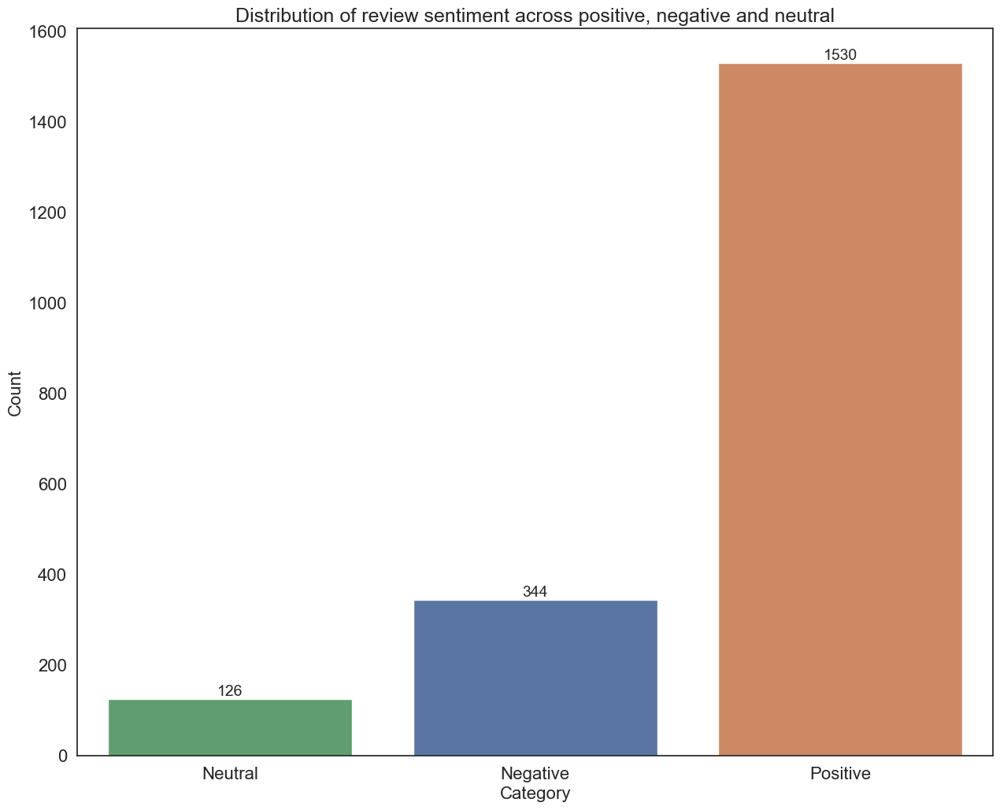

In [218]:
#Produce a simple barplot of the count of different review sentiments
countplot(series=rt_copy,x="sentiment_desc",title="Distribution of review sentiment across positive, negative and neutral",
          x_label="Category",y_label="Count",save_filename="sentiment_countplot.png")

## 7. Discuss: Insights and observations

Analysis using various NLP techniques such as word clouds, word frequency analysis and document term matrices after pre-processing has revealed that the overall sentiment from reviews is mildly positive.  Some encouraging terms like "play", "love", "like", "great", "fun game" etc all appear in the most common words and word groupings.  Over 75% come out as positive in the analysis and only around 17% are negative.  However negative sentiment in online reviews can be very damaging to brand reputation and future sales, so driving this even lower is a useful objective.  

Deeper investigation into the issues with products with the highest proportion of negative to positive reviews seems a useful course of action for the client so we will include these products in the report and presentation.

# 